Game 1000: Avg Reward Agent 1: 8.24, Avg Reward Agent 2: 4.72, Total Reward: 12956


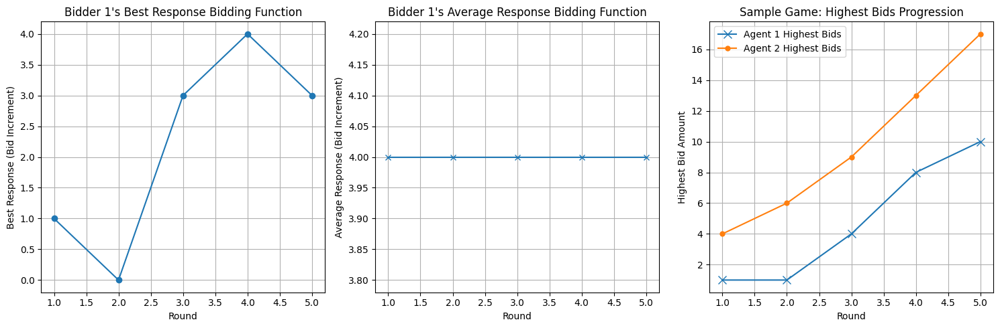

Game 2000: Avg Reward Agent 1: 7.31, Avg Reward Agent 2: 5.31, Total Reward: 12621


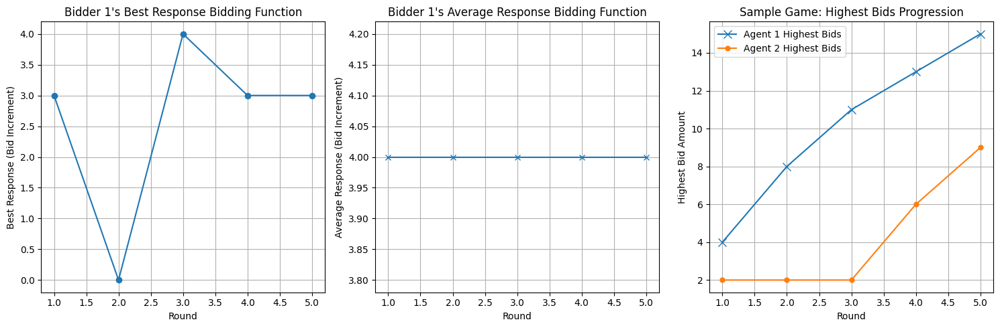

Game 3000: Avg Reward Agent 1: 7.34, Avg Reward Agent 2: 4.82, Total Reward: 12157


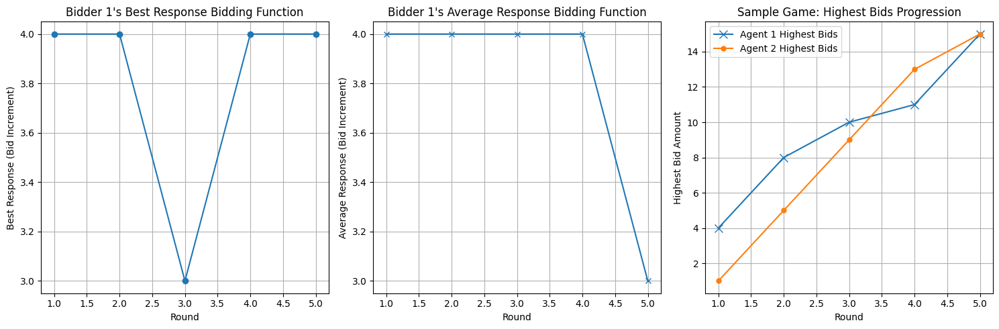

Game 4000: Avg Reward Agent 1: 6.66, Avg Reward Agent 2: 5.08, Total Reward: 11747


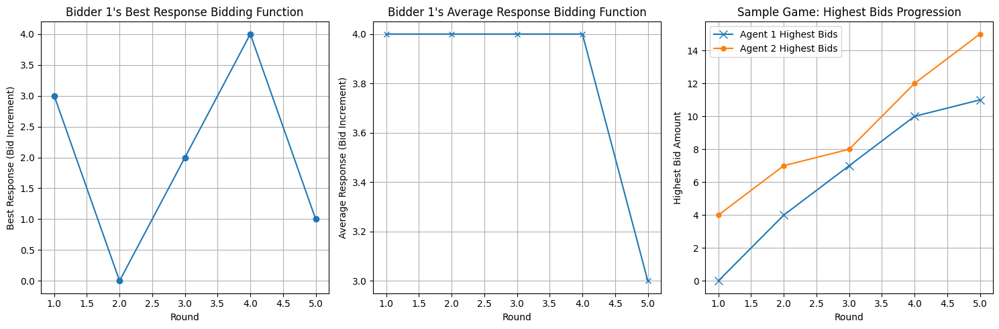

Game 5000: Avg Reward Agent 1: 6.19, Avg Reward Agent 2: 5.24, Total Reward: 11431


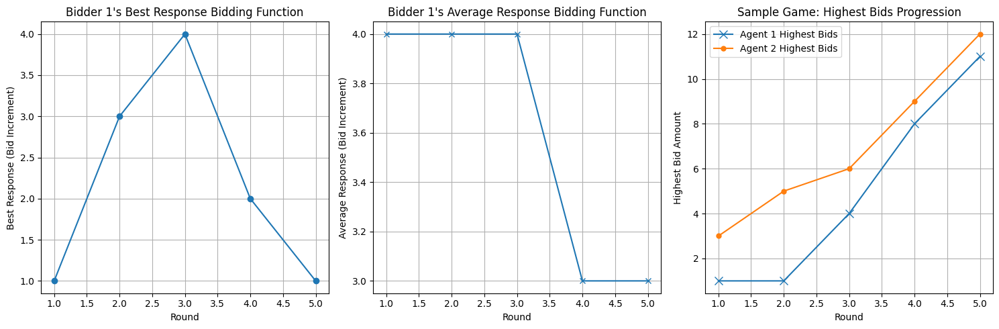

Game 6000: Avg Reward Agent 1: 6.17, Avg Reward Agent 2: 4.99, Total Reward: 11164


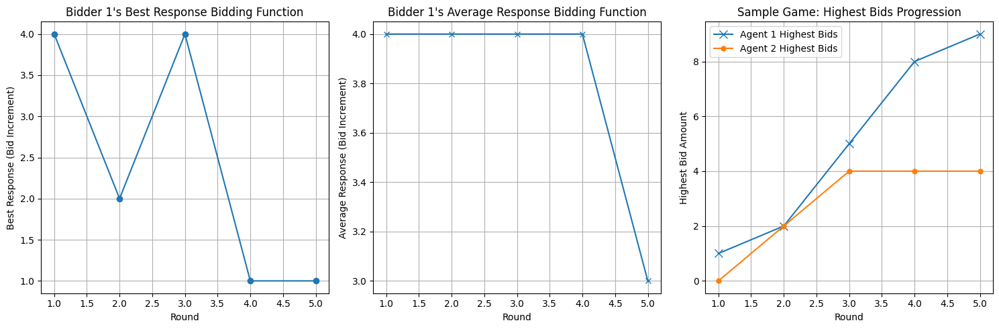

Game 7000: Avg Reward Agent 1: 5.93, Avg Reward Agent 2: 5.25, Total Reward: 11184


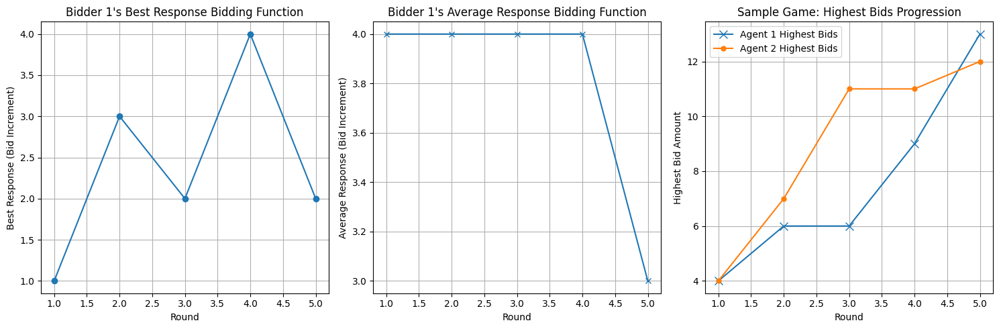

Game 8000: Avg Reward Agent 1: 5.77, Avg Reward Agent 2: 5.22, Total Reward: 10986


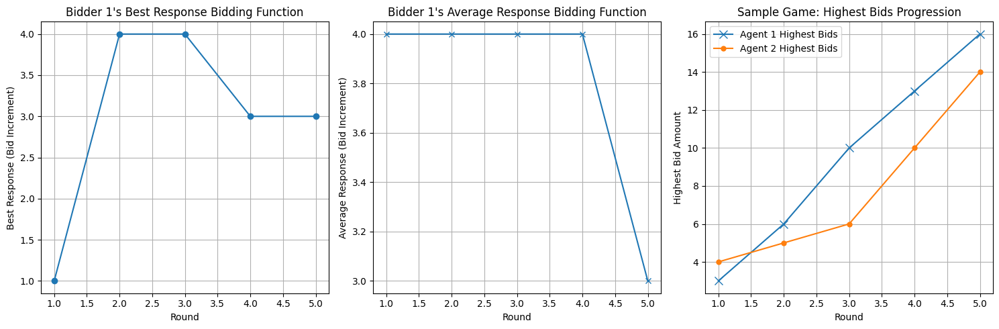

Game 9000: Avg Reward Agent 1: 5.83, Avg Reward Agent 2: 5.29, Total Reward: 11129


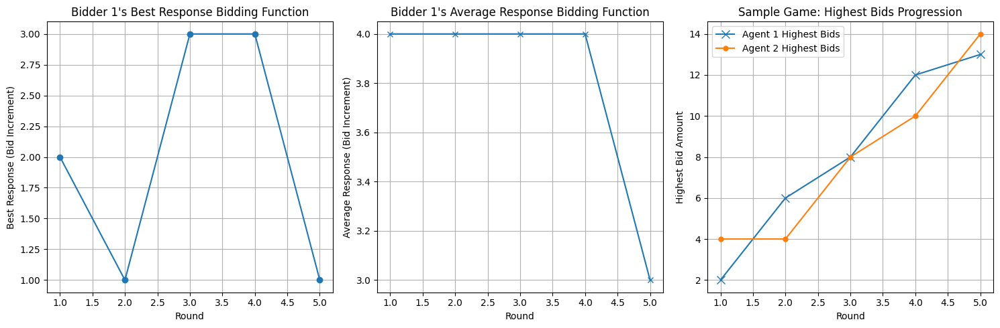

Game 10000: Avg Reward Agent 1: 5.38, Avg Reward Agent 2: 5.44, Total Reward: 10824


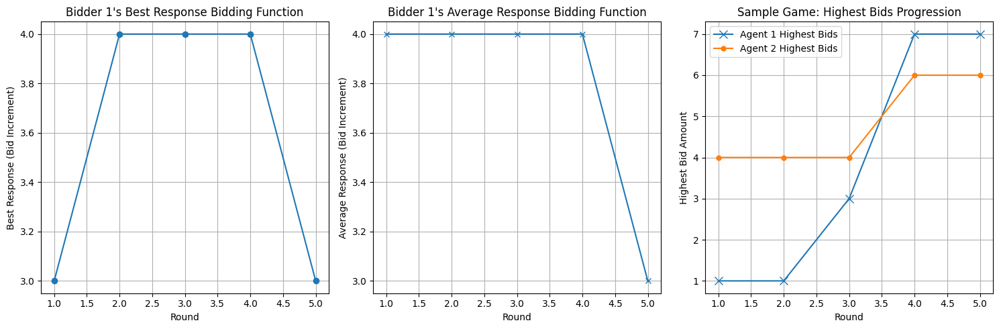

Game 11000: Avg Reward Agent 1: 5.50, Avg Reward Agent 2: 5.37, Total Reward: 10867


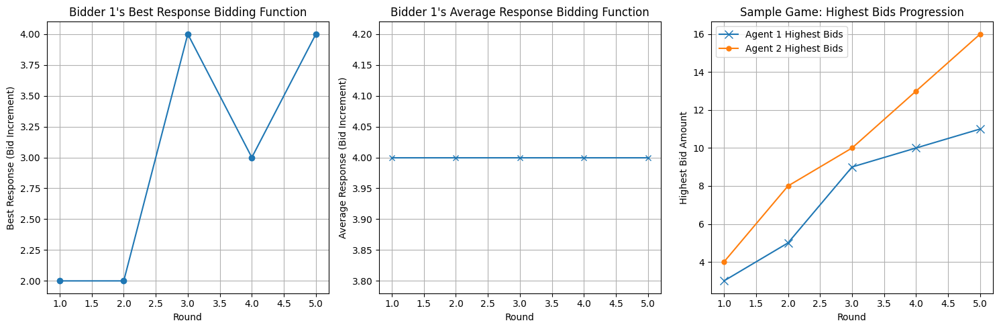

Game 12000: Avg Reward Agent 1: 5.72, Avg Reward Agent 2: 5.10, Total Reward: 10814


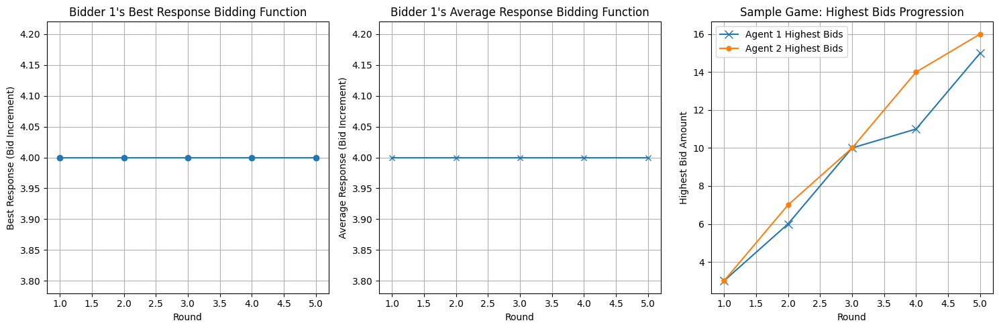

Game 13000: Avg Reward Agent 1: 5.39, Avg Reward Agent 2: 5.29, Total Reward: 10686


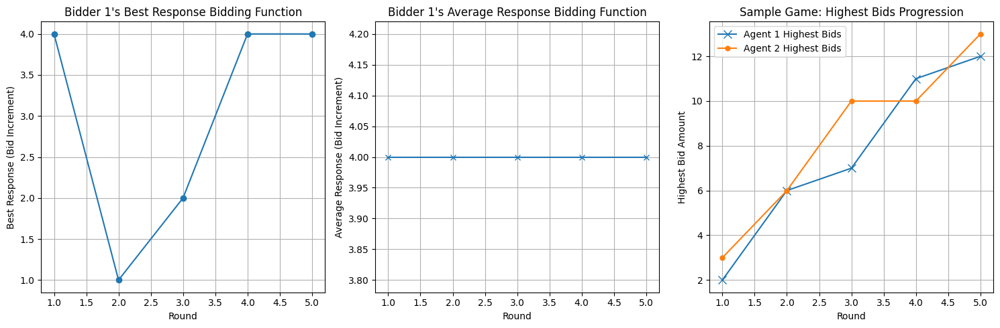

Game 14000: Avg Reward Agent 1: 5.35, Avg Reward Agent 2: 5.39, Total Reward: 10736


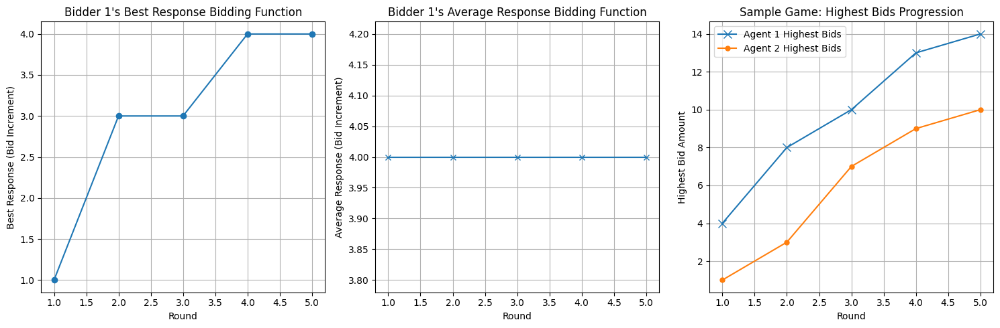

Game 15000: Avg Reward Agent 1: 5.46, Avg Reward Agent 2: 5.15, Total Reward: 10605


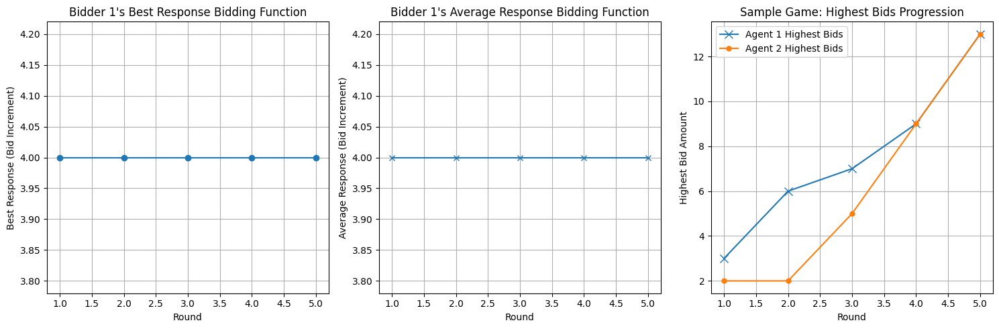

Game 16000: Avg Reward Agent 1: 5.36, Avg Reward Agent 2: 5.25, Total Reward: 10609


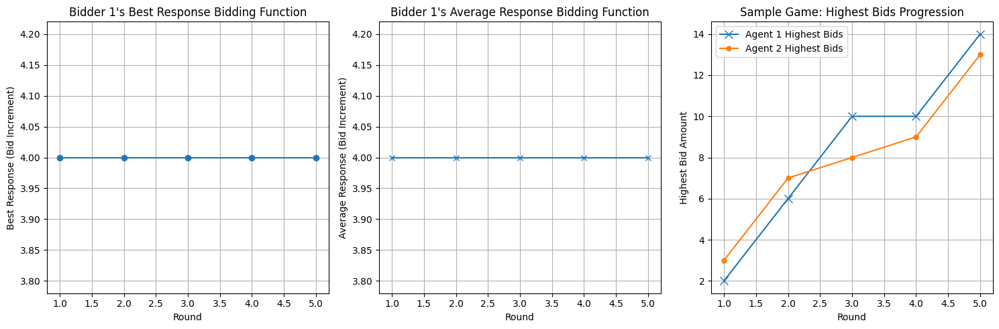

Game 17000: Avg Reward Agent 1: 5.39, Avg Reward Agent 2: 5.14, Total Reward: 10529


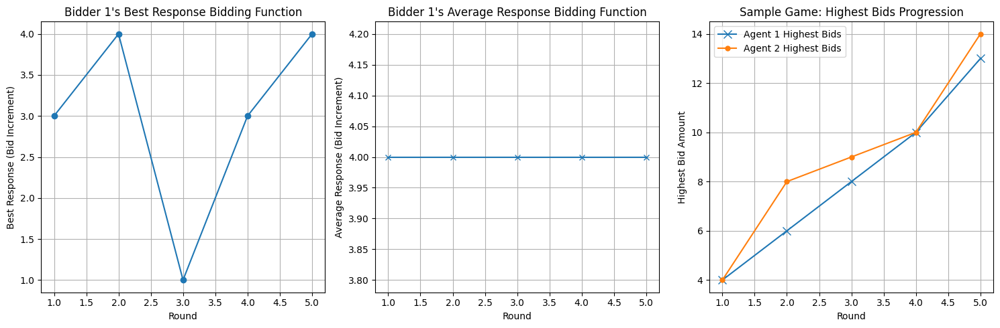

Game 18000: Avg Reward Agent 1: 5.08, Avg Reward Agent 2: 5.33, Total Reward: 10405


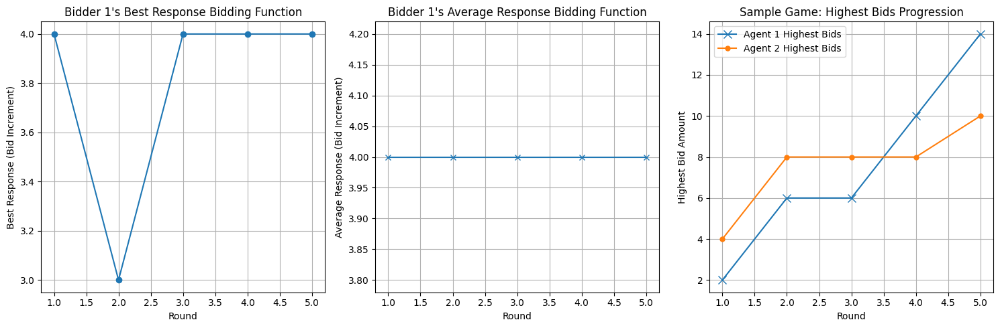

Game 19000: Avg Reward Agent 1: 5.36, Avg Reward Agent 2: 5.04, Total Reward: 10400


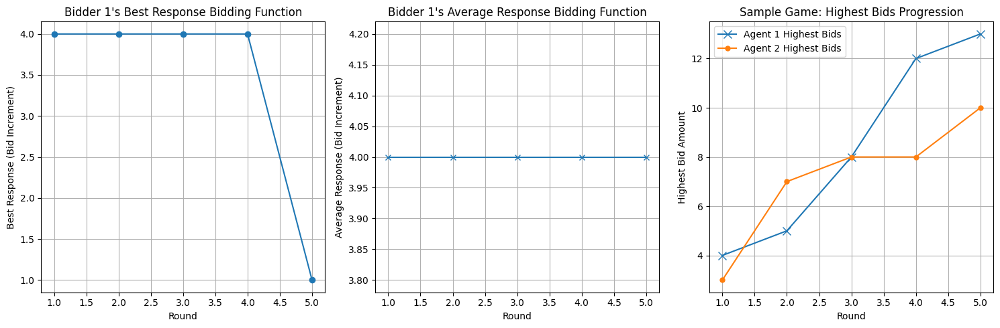

Game 20000: Avg Reward Agent 1: 5.39, Avg Reward Agent 2: 4.90, Total Reward: 10294


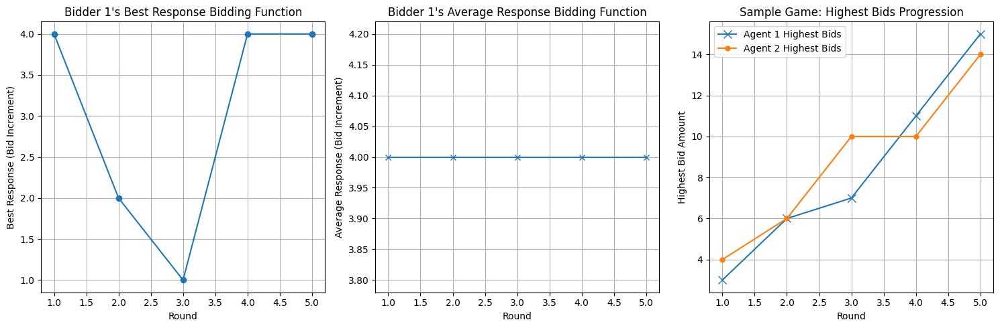

Game 21000: Avg Reward Agent 1: 5.26, Avg Reward Agent 2: 5.00, Total Reward: 10255


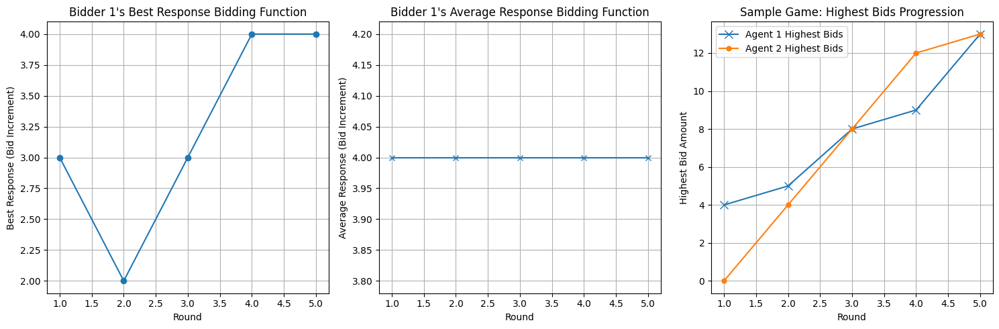

Game 22000: Avg Reward Agent 1: 5.03, Avg Reward Agent 2: 5.14, Total Reward: 10163


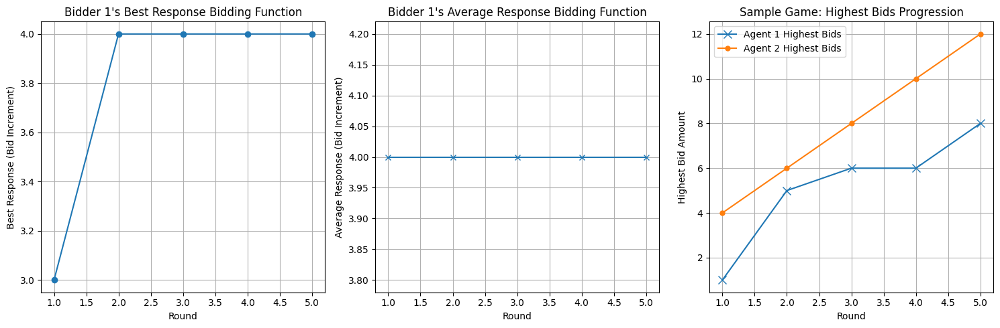

Game 23000: Avg Reward Agent 1: 5.12, Avg Reward Agent 2: 5.00, Total Reward: 10127


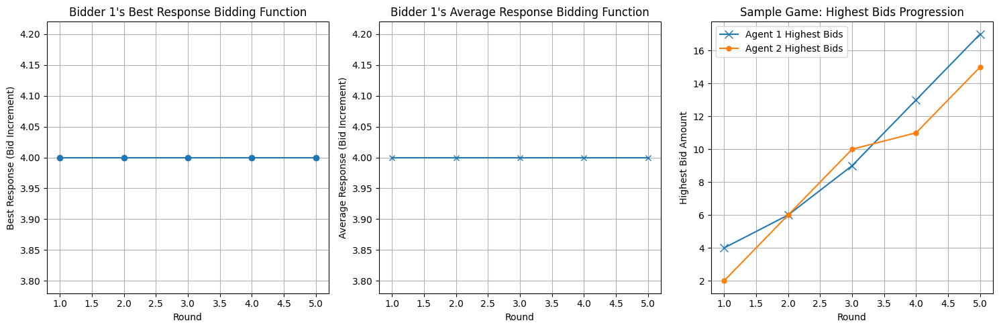

Game 24000: Avg Reward Agent 1: 5.07, Avg Reward Agent 2: 5.06, Total Reward: 10131


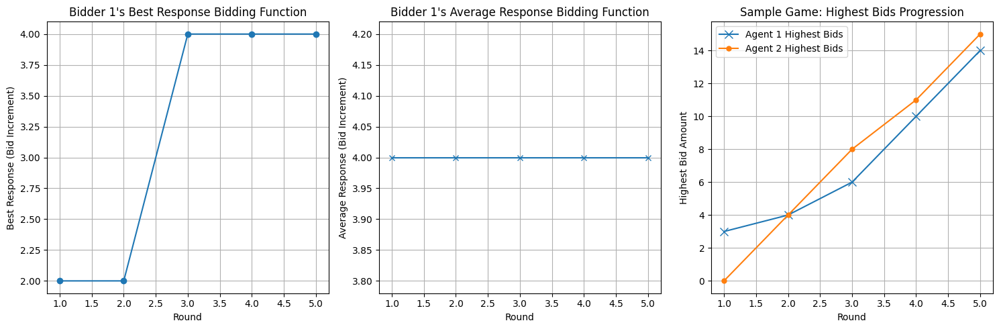

Game 25000: Avg Reward Agent 1: 5.08, Avg Reward Agent 2: 4.95, Total Reward: 10032


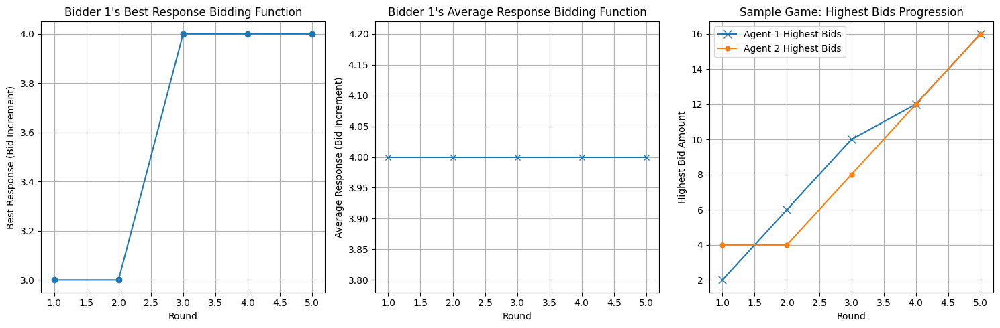

Game 26000: Avg Reward Agent 1: 5.12, Avg Reward Agent 2: 4.95, Total Reward: 10068


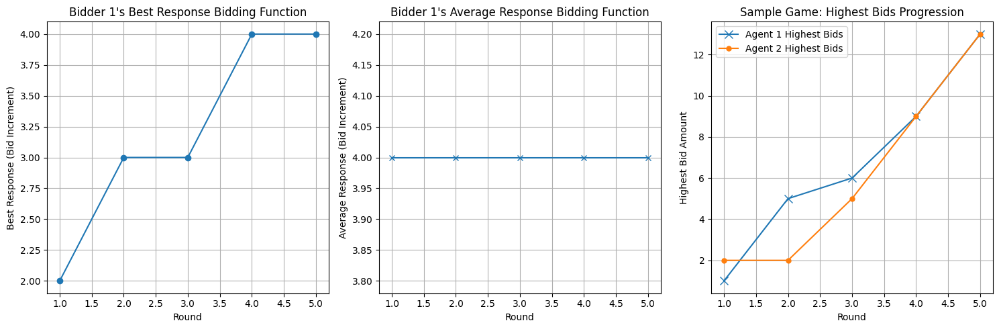

Game 27000: Avg Reward Agent 1: 5.06, Avg Reward Agent 2: 4.81, Total Reward: 9874


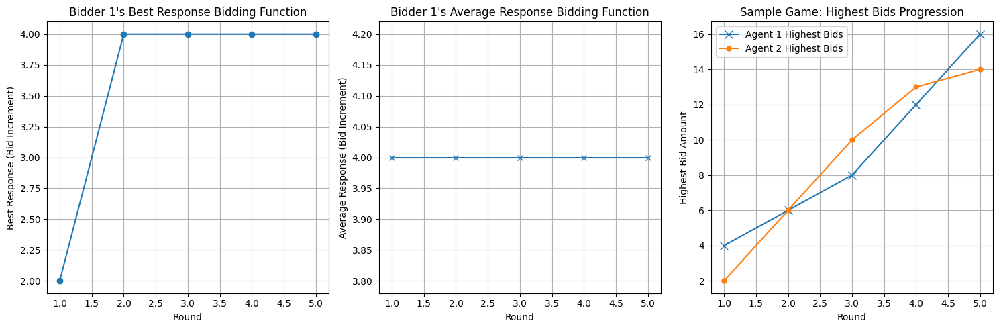

Game 28000: Avg Reward Agent 1: 4.93, Avg Reward Agent 2: 4.95, Total Reward: 9882


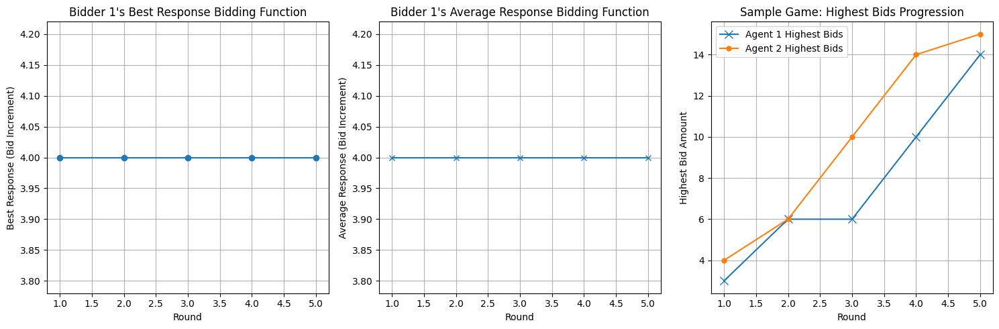

Game 29000: Avg Reward Agent 1: 4.63, Avg Reward Agent 2: 5.27, Total Reward: 9908


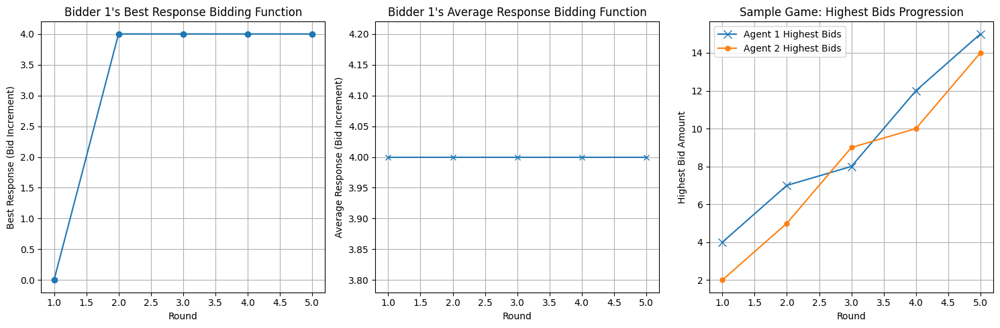

Game 30000: Avg Reward Agent 1: 4.92, Avg Reward Agent 2: 4.89, Total Reward: 9816


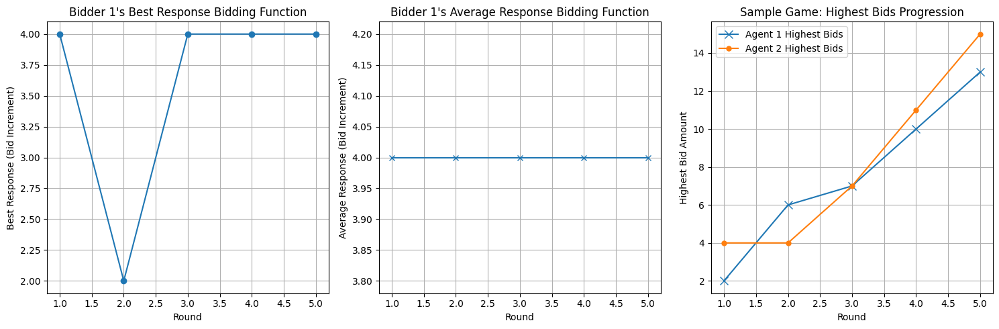

Game 31000: Avg Reward Agent 1: 4.85, Avg Reward Agent 2: 4.91, Total Reward: 9755


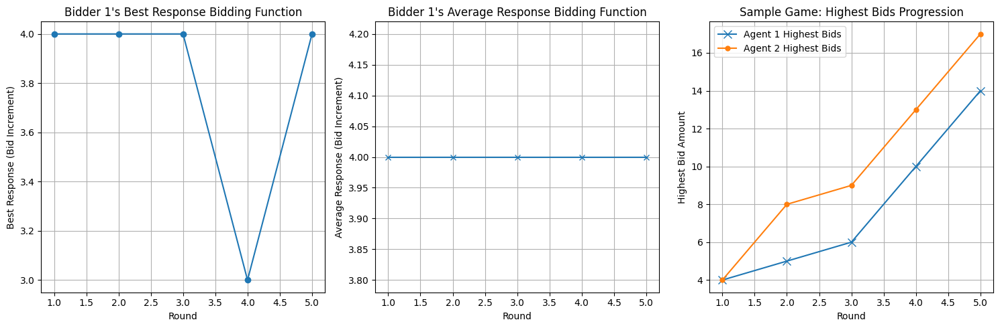

Game 32000: Avg Reward Agent 1: 4.87, Avg Reward Agent 2: 4.94, Total Reward: 9809


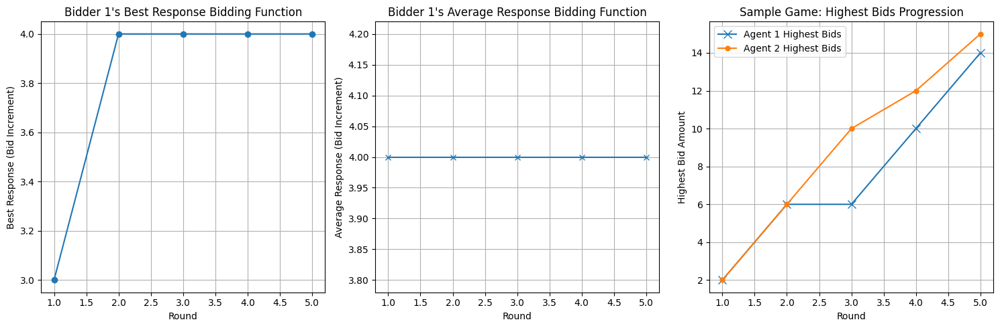

Game 33000: Avg Reward Agent 1: 5.01, Avg Reward Agent 2: 4.68, Total Reward: 9690


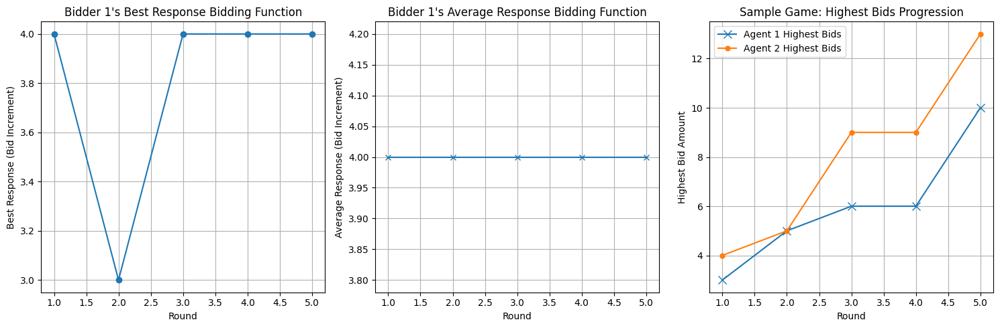

KeyboardInterrupt: 

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from collections import deque
import random

# Set random seeds for reproducibility
np.random.seed(0)
torch.manual_seed(0)

# Parameters
num_rounds = 5       # Number of rounds in each game
valuation = 25       # Maximum value that agents can bid for an item
num_actions = 5      # Total number of discrete actions (bids) each agent can take
actions = np.arange(num_actions)  # Possible actions (bids)
epsilon_start = 1.0   # Initial exploration rate (η)
epsilon_min = 0.01    # Minimum exploration rate
epsilon_decay = 0.9999  # Exploration decay rate (small decay)
learning_rate = 0.00025  # Learning rate for neural networks (Q-network and policy network)
discount_factor = 0.99   # Discount factor for future rewards (γ)
anticipatory_param = 0.1  # Probability of using the RL policy (η)
batch_size = 128       # Batch size for training (recommended)
memory_capacity_rl = 500000  # Capacity for RL replay buffer (M_RL)
memory_capacity_sl = 500000  # Capacity for SL replay buffer (M_SL)
num_games = 500_000    # Total number of games to train the agents
verbose_interval = 1000  # Interval at which training progress is printed
update_target_every = 500  # Target network update frequency

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Experience Replay Buffers
class CircularReplayBuffer:
    def __init__(self, capacity):
        self.capacity = capacity
        self.memory = deque(maxlen=capacity)
        
    def push(self, *args):
        self.memory.append(tuple(arg.detach().cpu() if isinstance(arg, torch.Tensor) else arg for arg in args))
        
    def sample(self, batch_size):
        batch = random.sample(self.memory, batch_size)
        return zip(*batch)
    
    def __len__(self):
        return len(self.memory)

class ReservoirReplayBuffer:
    def __init__(self, capacity):
        self.capacity = capacity
        self.memory = []
        self.n = 0  # Total number of items seen
        
    def push(self, *args):
        args = tuple(arg.detach().cpu() if isinstance(arg, torch.Tensor) else arg for arg in args)
        self.n += 1
        if len(self.memory) < self.capacity:
            self.memory.append(args)
        else:
            index = random.randint(0, self.n - 1)
            if index < self.capacity:
                self.memory[index] = args
                
    def sample(self, batch_size):
        batch = random.sample(self.memory, batch_size)
        return zip(*batch)
    
    def __len__(self):
        return len(self.memory)

# Neural Network Architectures
class QNetwork(nn.Module):
    def __init__(self, input_size, output_size):
        super(QNetwork, self).__init__()
        self.fc1 = nn.Linear(input_size, 64)
        self.fc2 = nn.Linear(64, output_size)
        self.relu = nn.ReLU()
        
    def forward(self, x):
        x = x.float()
        x = self.relu(self.fc1(x))
        x = self.fc2(x)
        return x

class PolicyNetwork(nn.Module):
    def __init__(self, input_size, output_size):
        super(PolicyNetwork, self).__init__()
        self.fc1 = nn.Linear(input_size, 64)
        self.fc2 = nn.Linear(64, output_size)
        self.relu = nn.ReLU()
        self.softmax = nn.Softmax(dim=1)
        
    def forward(self, x):
        x = x.float()
        x = self.relu(self.fc1(x))
        x = self.fc2(x)
        x = self.softmax(x)
        return x

# NFSPAgent Class
class NFSPAgent:
    def __init__(self, num_rounds, num_actions, anticipatory_param, agent_id):
        self.num_rounds = num_rounds
        self.num_actions = num_actions
        self.anticipatory_param = anticipatory_param
        self.epsilon = epsilon_start
        self.epsilon_min = epsilon_min
        self.epsilon_decay = epsilon_decay
        self.agent_id = agent_id
        
        # Input size includes the state representation: [rounds_left, holding_highest_bid (0/1), current_bid]
        input_size = 3
        self.q_network = QNetwork(input_size, num_actions).to(device)
        self.q_network_target = QNetwork(input_size, num_actions).to(device)
        self.policy_network = PolicyNetwork(input_size, num_actions).to(device)
        
        self.q_network_target.load_state_dict(self.q_network.state_dict())
        self.q_network_target.eval()
        
        # Optimizers
        self.q_optimizer = optim.Adam(self.q_network.parameters(), lr=learning_rate)
        self.policy_optimizer = optim.Adam(self.policy_network.parameters(), lr=learning_rate)
        
        # Replay Buffers
        self.replay_memory_rl = CircularReplayBuffer(memory_capacity_rl)
        self.replay_memory_sl = ReservoirReplayBuffer(memory_capacity_sl)
        
        self.steps_done = 0
        
    def select_action(self, state):
        state_tensor = torch.tensor([state], device=device)
        if random.random() < self.anticipatory_param:
            # Best Response Strategy (ε-greedy)
            if random.random() < self.epsilon:
                action = random.randrange(self.num_actions)
            else:
                with torch.no_grad():
                    action = self.q_network(state_tensor).argmax().item()
            use_best_response = True
        else:
            # Average Strategy (Policy Network)
            with torch.no_grad():
                probabilities = self.policy_network(state_tensor)
                action = np.random.choice(self.num_actions, p=probabilities.cpu().numpy()[0])
            use_best_response = False
        return action, use_best_response
        
    def add_experience_rl(self, state, action, reward, next_state, done):
        self.replay_memory_rl.push(torch.tensor(state, device=device),
                                   torch.tensor([action], device=device),
                                   torch.tensor([reward], device=device),
                                   torch.tensor(next_state, device=device),
                                   torch.tensor([done], device=device))
        
    def add_experience_sl(self, state, action):
        self.replay_memory_sl.push(torch.tensor(state, device=device),
                                   torch.tensor([action], device=device))
        
    def train_q_network(self):
        if len(self.replay_memory_rl) < batch_size:
            return
        states, actions, rewards, next_states, dones = self.replay_memory_rl.sample(batch_size)
        states = torch.stack(states).to(device)
        actions = torch.cat(actions).to(device)
        rewards = torch.cat(rewards).to(device)
        next_states = torch.stack(next_states).to(device)
        dones = torch.cat(dones).to(device).float()
        
        q_values = self.q_network(states).gather(1, actions.unsqueeze(1)).squeeze()
        with torch.no_grad():
            next_q_values = self.q_network_target(next_states).max(1)[0]
            target_q_values = rewards + (discount_factor * next_q_values * (1 - dones))
        
        loss = nn.functional.mse_loss(q_values, target_q_values)
        
        self.q_optimizer.zero_grad()
        loss.backward()
        self.q_optimizer.step()
        
    def train_policy_network(self):
        if len(self.replay_memory_sl) < batch_size:
            return
        states, actions = self.replay_memory_sl.sample(batch_size)
        states = torch.stack(states).to(device)
        actions = torch.cat(actions).to(device)
        
        probabilities = self.policy_network(states)
        loss = nn.functional.nll_loss(torch.log(probabilities), actions)
        
        self.policy_optimizer.zero_grad()
        loss.backward()
        self.policy_optimizer.step()
        
    def update_target_network(self):
        self.q_network_target.load_state_dict(self.q_network.state_dict())
        
    def decay_epsilon(self):
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay
        else:
            self.epsilon = self.epsilon_min

# Korean Auction Environment
class KoreanAuctionEnv:
    def __init__(self, num_rounds, num_actions, valuation):
        self.num_rounds = num_rounds
        self.num_actions = num_actions
        self.valuation = valuation
        self.reset()
        
    def reset(self):
        self.t = self.num_rounds
        self.s = 0  # 0 if Agent 1 holds the highest bid, 1 if Agent 2
        self.current_bid_q1 = 0
        self.current_bid_q2 = 0
        self.done = False
        return self.get_state()
        
    def get_state(self):
        # State representation: [rounds_left, holding_highest_bid (0 or 1), current_bid]
        state_q1 = [self.t, int(self.s == 0), self.current_bid_q1]
        state_q2 = [self.t, int(self.s == 1), self.current_bid_q2]
        return state_q1, state_q2
    
    def step(self, action_q1, action_q2):
        self.current_bid_q1 += action_q1
        self.current_bid_q2 += action_q2
        
        # Update who holds the highest bid
        if self.current_bid_q1 >= self.current_bid_q2:
            self.s = 0
        else:
            self.s = 1
        
        self.t -= 1
        if self.t <= 0:
            self.done = True
            # Calculate rewards
            if self.current_bid_q1 >= self.current_bid_q2 and self.current_bid_q1 <= self.valuation:
                reward_q1 = self.valuation - self.current_bid_q1
            else:
                reward_q1 = 0
            if self.current_bid_q2 > self.current_bid_q1 and self.current_bid_q2 <= self.valuation:
                reward_q2 = self.valuation - self.current_bid_q2
            else:
                reward_q2 = 0
        else:
            reward_q1 = 0
            reward_q2 = 0
        
        next_state_q1, next_state_q2 = self.get_state()
        return (next_state_q1, next_state_q2), (reward_q1, reward_q2), self.done

# Training function
def train_agents(agent1, agent2, env):
    reward_history_q1 = []
    reward_history_q2 = []
    steps = 0
    
    for game in range(num_games):
        state_q1, state_q2 = env.reset()
        while True:
            # Agent 1 selects action
            action_q1, use_br_q1 = agent1.select_action(state_q1)
            # Agent 2 selects action
            action_q2, use_br_q2 = agent2.select_action(state_q2)
            
            next_state, rewards, done = env.step(action_q1, action_q2)
            next_state_q1, next_state_q2 = next_state
            reward_q1, reward_q2 = rewards
            
            # Store transitions for RL
            agent1.add_experience_rl(state_q1, action_q1, reward_q1, next_state_q1, done)
            agent2.add_experience_rl(state_q2, action_q2, reward_q2, next_state_q2, done)
            
            # Store behavior for SL if used best response strategy
            if use_br_q1:
                agent1.add_experience_sl(state_q1, action_q1)
            if use_br_q2:
                agent2.add_experience_sl(state_q2, action_q2)
            
            # Train agents
            agent1.train_q_network()
            agent1.train_policy_network()
            agent2.train_q_network()
            agent2.train_policy_network()
            
            # Update target networks periodically
            steps += 1
            if steps % update_target_every == 0:
                agent1.update_target_network()
                agent2.update_target_network()
            
            if done:
                agent1.decay_epsilon()
                agent2.decay_epsilon()
                reward_history_q1.append(reward_q1)
                reward_history_q2.append(reward_q2)
                break
                
            state_q1 = next_state_q1
            state_q2 = next_state_q2
        
        if (game + 1) % verbose_interval == 0:
            avg_reward_q1 = np.mean(reward_history_q1[-verbose_interval:])
            avg_reward_q2 = np.mean(reward_history_q2[-verbose_interval:])
            total_reward = np.sum(reward_history_q1[-verbose_interval:]) + np.sum(reward_history_q2[-verbose_interval:])
            
            print(f"Game {game + 1}: Avg Reward Agent 1: {avg_reward_q1:.2f}, Avg Reward Agent 2: {avg_reward_q2:.2f}, Total Reward: {total_reward}")
            
            # Visualize best response and average response bidding functions + a sample game
            visualize_verbose_plots(agent1, env)

    return agent1, agent2, reward_history_q1, reward_history_q2

def visualize_verbose_plots(agent1, env):
    rounds = np.arange(1, num_rounds + 1)
    
    # 1. Best response bidding function (RL policy)
    best_response_actions = []
    for r in rounds:
        state = [num_rounds - r, 1, 0]  # Example state: round left, holding highest bid, current bid = 0
        action, _ = agent1.select_action(state)
        best_response_actions.append(action)
    
    # 2. Average response bidding function (SL policy)
    avg_response_actions = []
    for r in rounds:
        state = [num_rounds - r, 1, 0]  # Example state
        with torch.no_grad():
            state_tensor = torch.tensor([state], device=device)
            probabilities = agent1.policy_network(state_tensor)
            avg_action = np.argmax(probabilities.cpu().numpy()[0])
            avg_response_actions.append(avg_action)
    
    # 3. Sample game between two agents
    highest_bids_q1, highest_bids_q2, reward_q1, reward_q2, actions_q1, actions_q2 = play_game(agent1, agent1, env)
    
    plt.figure(figsize=(15, 5))
    
    # Plot 1: Best response bidding function vs rounds
    plt.subplot(1, 3, 1)
    plt.plot(rounds, best_response_actions, marker='o')
    plt.title("Bidder 1's Best Response Bidding Function")
    plt.xlabel('Round')
    plt.ylabel('Best Response (Bid Increment)')
    plt.grid(True)
    
    # Plot 2: Average response bidding function vs rounds
    plt.subplot(1, 3, 2)
    plt.plot(rounds, avg_response_actions, marker='x')
    plt.title("Bidder 1's Average Response Bidding Function")
    plt.xlabel('Round')
    plt.ylabel('Average Response (Bid Increment)')
    plt.grid(True)
    
    # Plot 3: Sample game between two agents
    plt.subplot(1, 3, 3)
    plt.plot(rounds, highest_bids_q1, 'x-', label='Agent 1 Highest Bids', markersize=8)
    plt.plot(rounds, highest_bids_q2, 'o-', label='Agent 2 Highest Bids', markersize=5)
    plt.title('Sample Game: Highest Bids Progression')
    plt.xlabel('Round')
    plt.ylabel('Highest Bid Amount')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()

# Play and visualize game function
def play_game(agent1, agent2, env):
    state_q1, state_q2 = env.reset()
    highest_bids_q1 = []
    highest_bids_q2 = []
    actions_q1 = []
    actions_q2 = []
    while True:
        action_q1, _ = agent1.select_action(state_q1)
        action_q2, _ = agent2.select_action(state_q2)
        actions_q1.append(action_q1)
        actions_q2.append(action_q2)
        next_state, rewards, done = env.step(action_q1, action_q2)
        next_state_q1, next_state_q2 = next_state
        highest_bids_q1.append(env.current_bid_q1)
        highest_bids_q2.append(env.current_bid_q2)
        if done:
            reward_q1, reward_q2 = rewards
            break
        state_q1 = next_state_q1
        state_q2 = next_state_q2
    return highest_bids_q1, highest_bids_q2, reward_q1, reward_q2, actions_q1, actions_q2

# Initialize environment and agents
env = KoreanAuctionEnv(num_rounds, num_actions, valuation)
agent1 = NFSPAgent(num_rounds, num_actions, anticipatory_param, agent_id=1)
agent2 = NFSPAgent(num_rounds, num_actions, anticipatory_param, agent_id=2)

# Train the agents
agent1, agent2, reward_history_q1, reward_history_q2 = train_agents(agent1, agent2, env)

# Play and visualize a game
highest_bids_q1, highest_bids_q2, reward_q1, reward_q2, actions_q1, actions_q2 = play_game(agent1, agent2, env)
visualize_verbose_plots(agent1, env)

print(f"Reward for Agent 1: {reward_q1}")
print(f"Reward for Agent 2: {reward_q2}")


Game 1000: Avg Reward Agent 1: 2.29, Avg Reward Agent 2: 1.92, Epsilon: 0.0594, Total Avg Reward: 2.108


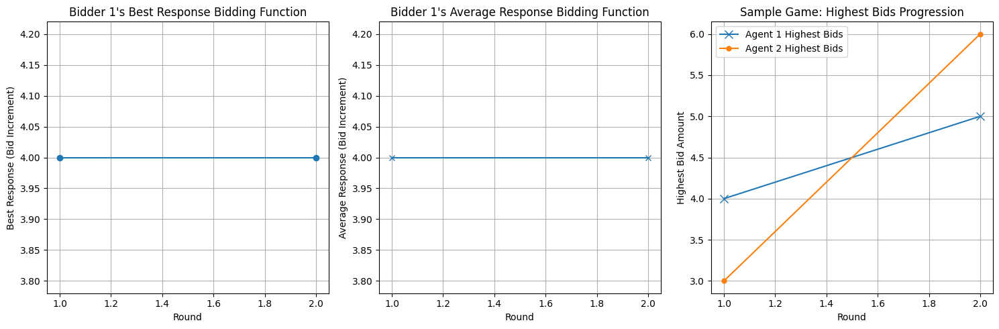

Game 2000: Avg Reward Agent 1: 1.20, Avg Reward Agent 2: 1.70, Epsilon: 0.0588, Total Avg Reward: 1.4465


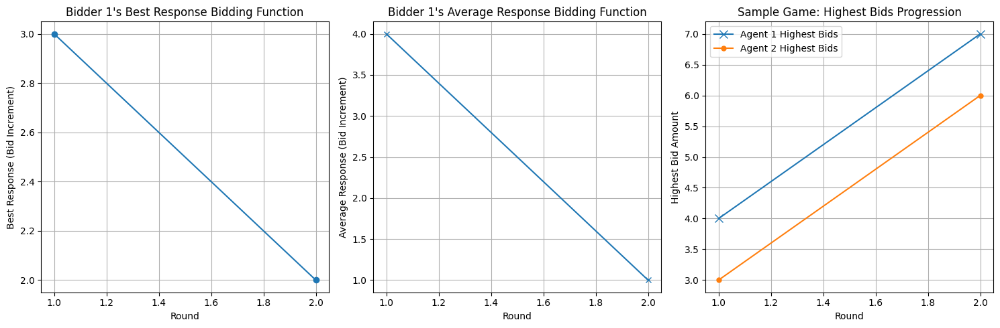

Game 3000: Avg Reward Agent 1: 1.33, Avg Reward Agent 2: 1.61, Epsilon: 0.0582, Total Avg Reward: 1.471


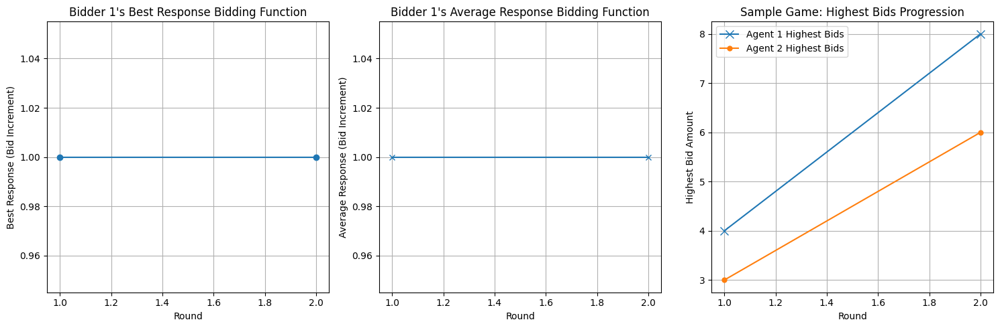

Game 4000: Avg Reward Agent 1: 1.60, Avg Reward Agent 2: 1.56, Epsilon: 0.0576, Total Avg Reward: 1.5805


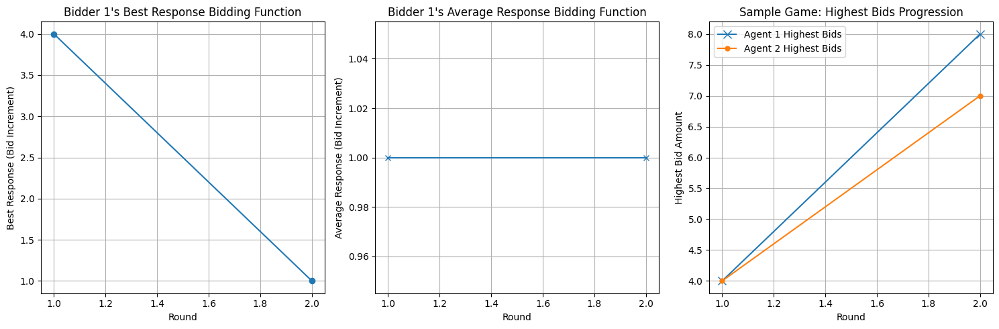

Game 5000: Avg Reward Agent 1: 1.45, Avg Reward Agent 2: 1.69, Epsilon: 0.0571, Total Avg Reward: 1.571


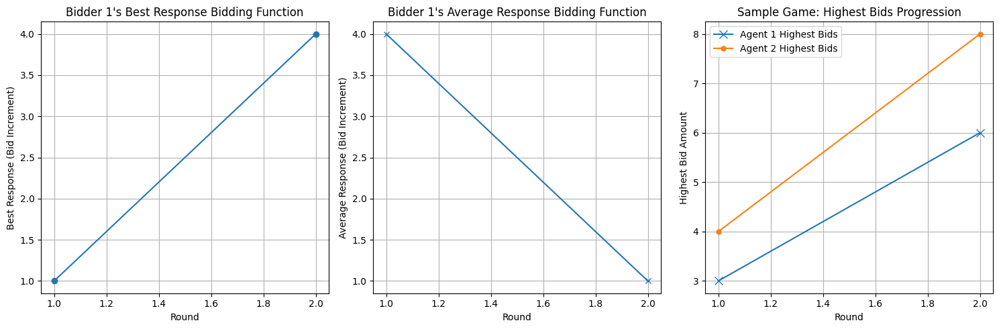

Game 6000: Avg Reward Agent 1: 1.53, Avg Reward Agent 2: 1.45, Epsilon: 0.0565, Total Avg Reward: 1.4935


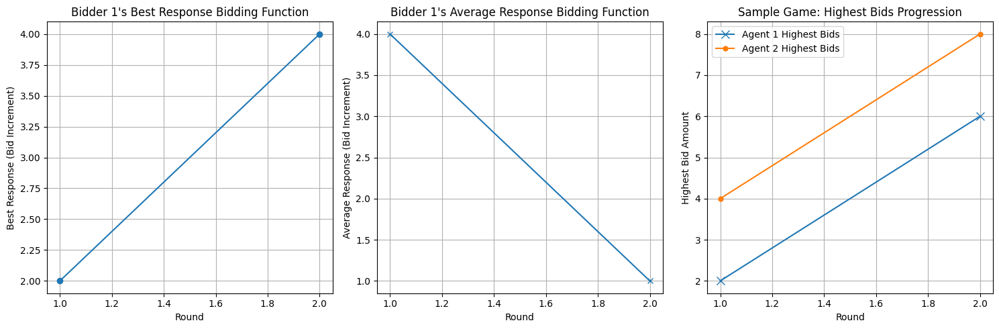

Game 7000: Avg Reward Agent 1: 1.65, Avg Reward Agent 2: 1.36, Epsilon: 0.0559, Total Avg Reward: 1.504


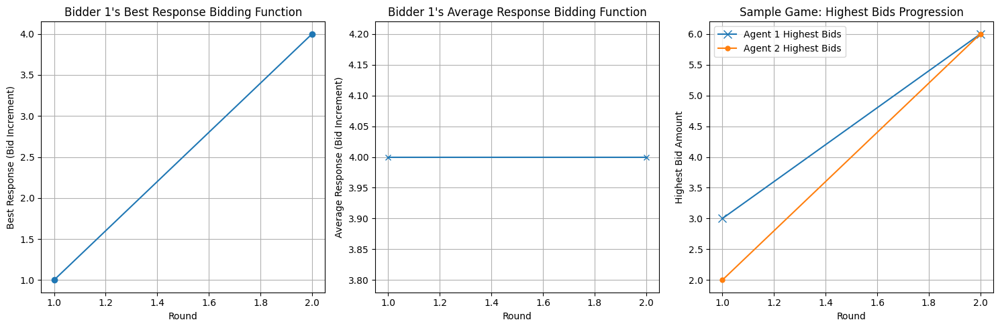

Game 8000: Avg Reward Agent 1: 1.66, Avg Reward Agent 2: 1.32, Epsilon: 0.0554, Total Avg Reward: 1.4895


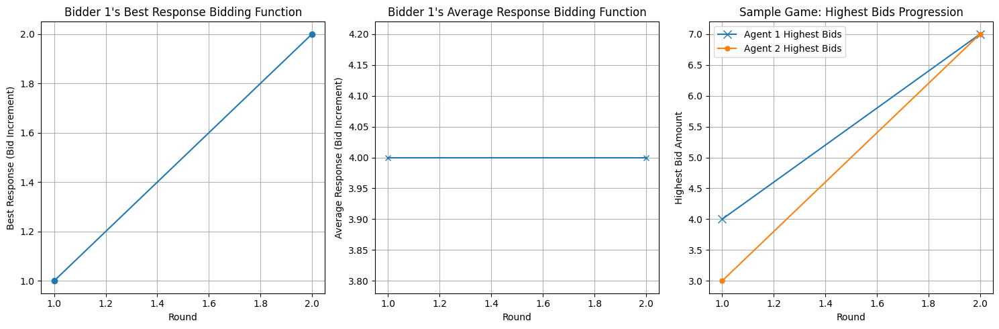

Game 9000: Avg Reward Agent 1: 1.69, Avg Reward Agent 2: 1.24, Epsilon: 0.0548, Total Avg Reward: 1.4625


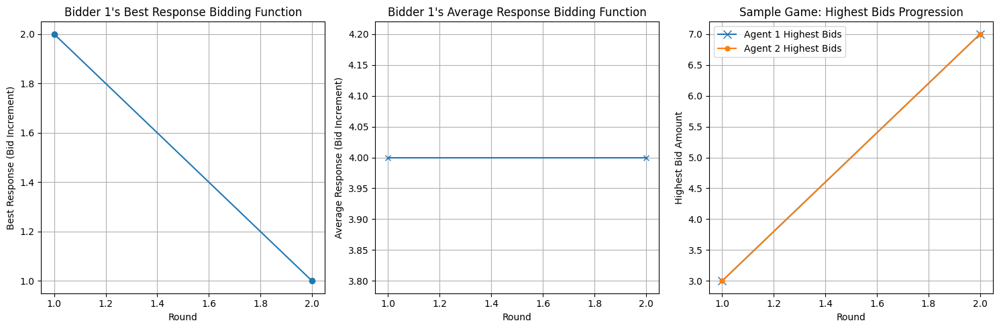

Game 10000: Avg Reward Agent 1: 1.71, Avg Reward Agent 2: 1.18, Epsilon: 0.0543, Total Avg Reward: 1.443


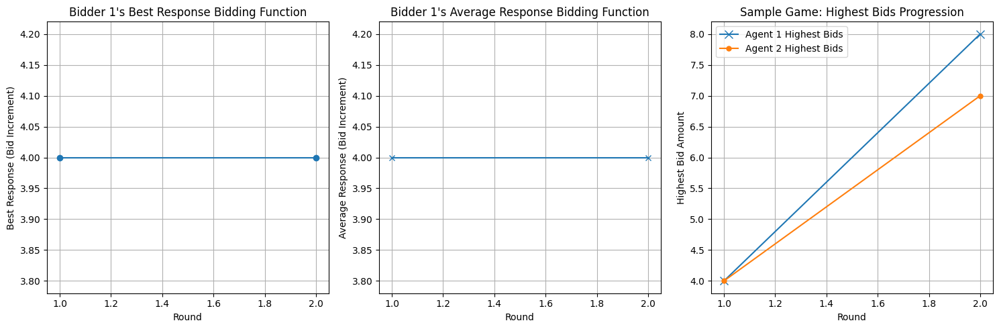

Game 11000: Avg Reward Agent 1: 1.75, Avg Reward Agent 2: 1.10, Epsilon: 0.0538, Total Avg Reward: 1.4215


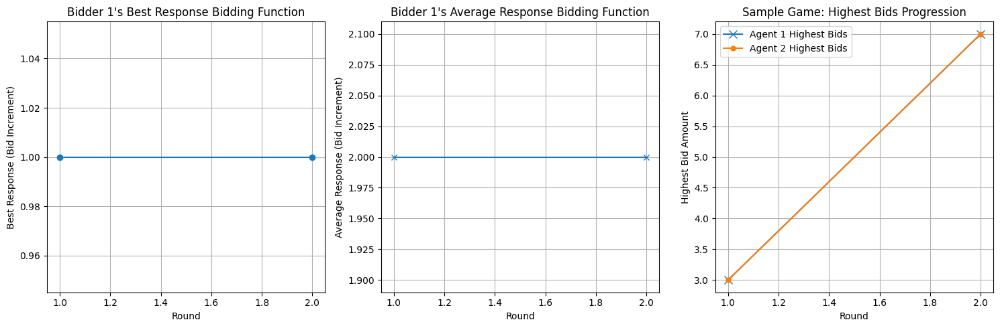

Game 12000: Avg Reward Agent 1: 1.74, Avg Reward Agent 2: 1.09, Epsilon: 0.0532, Total Avg Reward: 1.4155


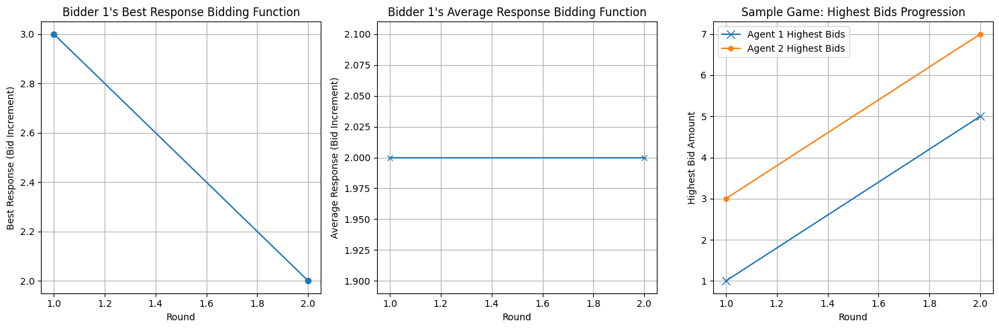

Game 13000: Avg Reward Agent 1: 1.67, Avg Reward Agent 2: 1.11, Epsilon: 0.0527, Total Avg Reward: 1.39


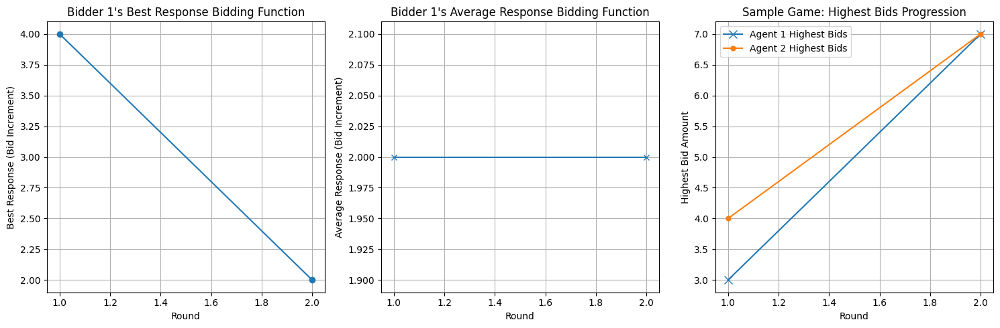

Game 14000: Avg Reward Agent 1: 1.60, Avg Reward Agent 2: 1.11, Epsilon: 0.0522, Total Avg Reward: 1.354


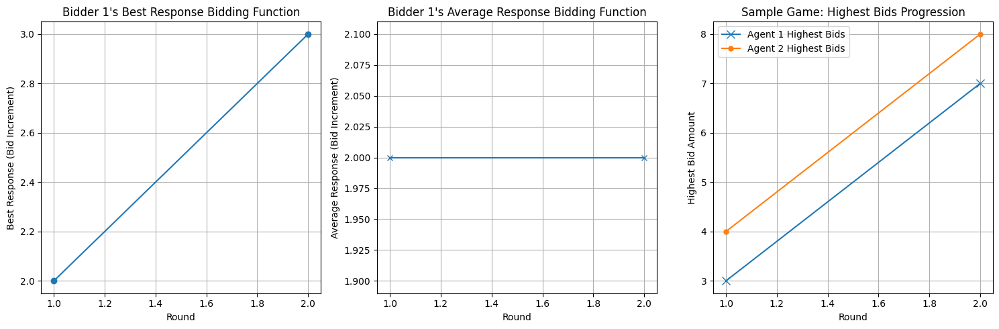

Game 15000: Avg Reward Agent 1: 1.51, Avg Reward Agent 2: 1.14, Epsilon: 0.0516, Total Avg Reward: 1.326


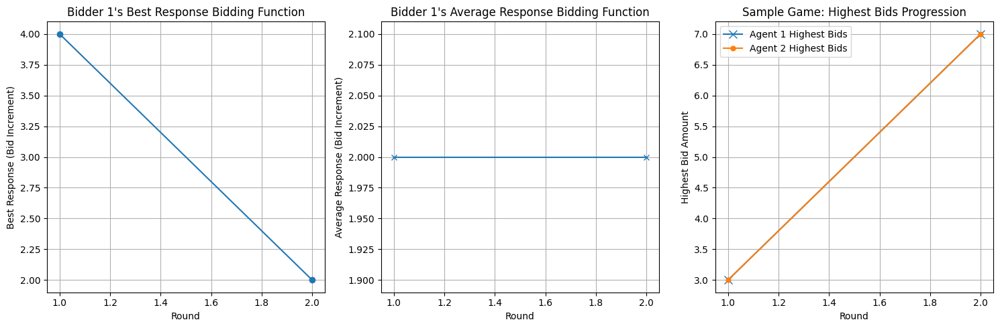

Game 16000: Avg Reward Agent 1: 1.47, Avg Reward Agent 2: 1.18, Epsilon: 0.0511, Total Avg Reward: 1.3235


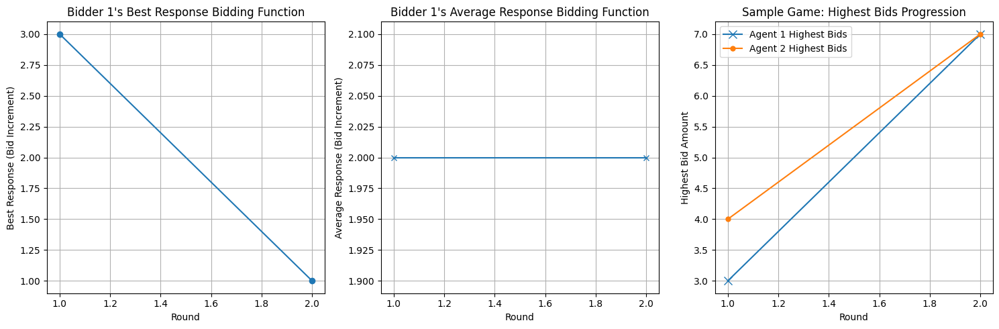

Game 17000: Avg Reward Agent 1: 1.39, Avg Reward Agent 2: 1.19, Epsilon: 0.0506, Total Avg Reward: 1.2875


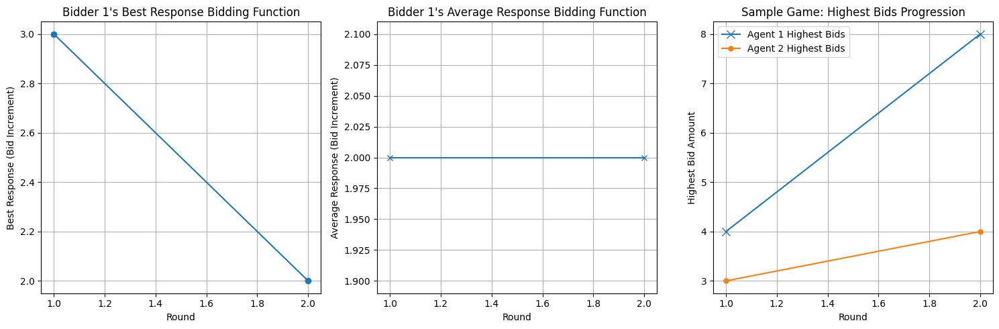

Game 18000: Avg Reward Agent 1: 1.34, Avg Reward Agent 2: 1.20, Epsilon: 0.0501, Total Avg Reward: 1.27


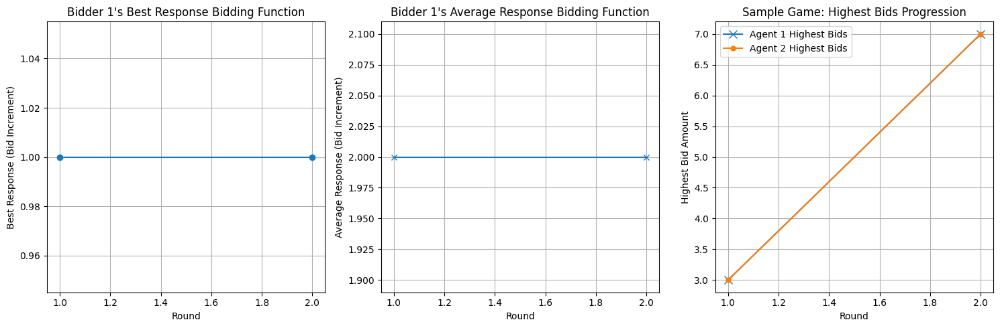

Game 19000: Avg Reward Agent 1: 1.32, Avg Reward Agent 2: 1.21, Epsilon: 0.0496, Total Avg Reward: 1.268


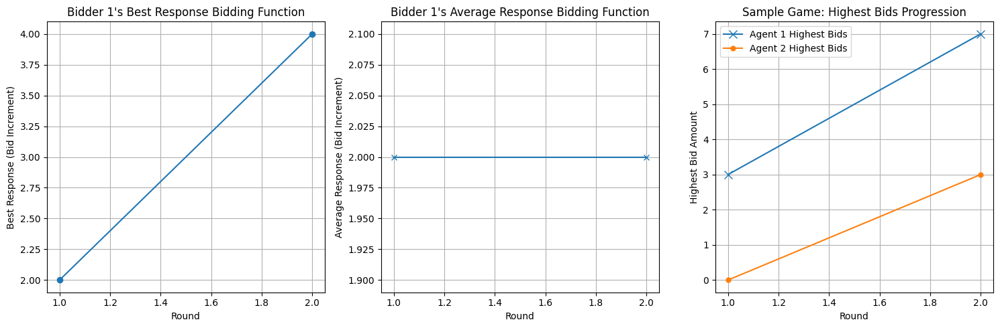

Game 20000: Avg Reward Agent 1: 1.25, Avg Reward Agent 2: 1.22, Epsilon: 0.0491, Total Avg Reward: 1.237


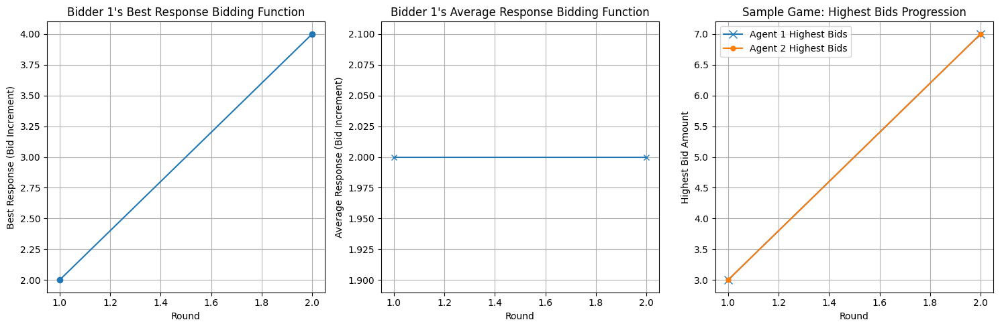

Game 21000: Avg Reward Agent 1: 1.20, Avg Reward Agent 2: 1.26, Epsilon: 0.0486, Total Avg Reward: 1.2315


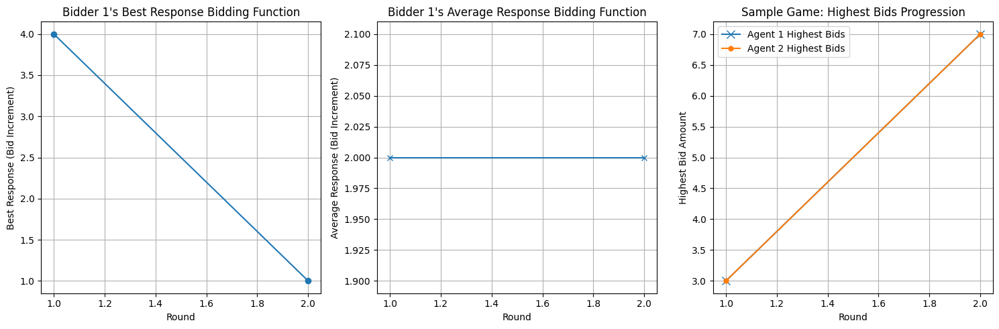

Game 22000: Avg Reward Agent 1: 1.21, Avg Reward Agent 2: 1.24, Epsilon: 0.0482, Total Avg Reward: 1.2255


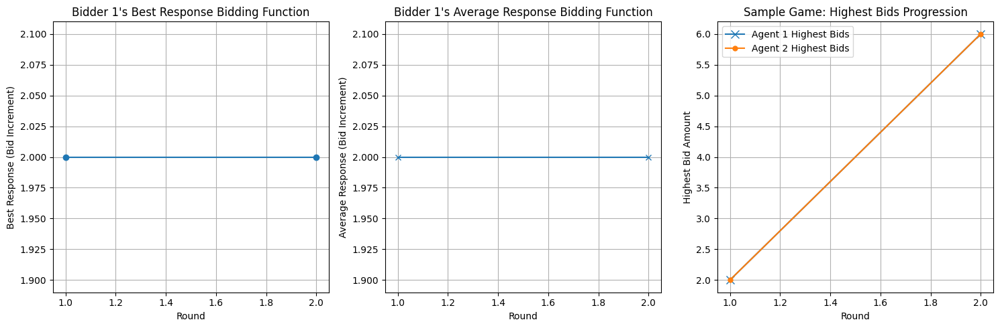

Game 23000: Avg Reward Agent 1: 1.16, Avg Reward Agent 2: 1.25, Epsilon: 0.0477, Total Avg Reward: 1.2095


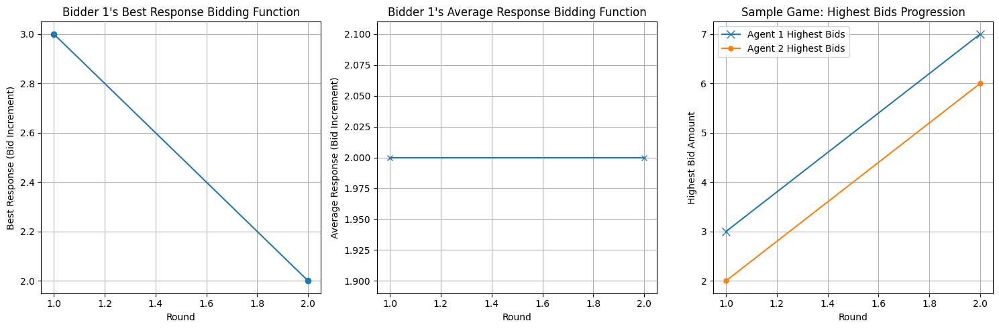

Game 24000: Avg Reward Agent 1: 1.07, Avg Reward Agent 2: 1.30, Epsilon: 0.0472, Total Avg Reward: 1.186


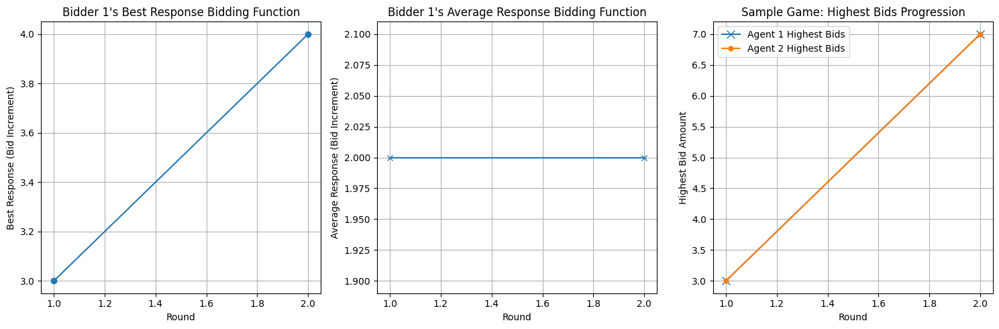

Game 25000: Avg Reward Agent 1: 1.13, Avg Reward Agent 2: 1.21, Epsilon: 0.0467, Total Avg Reward: 1.172


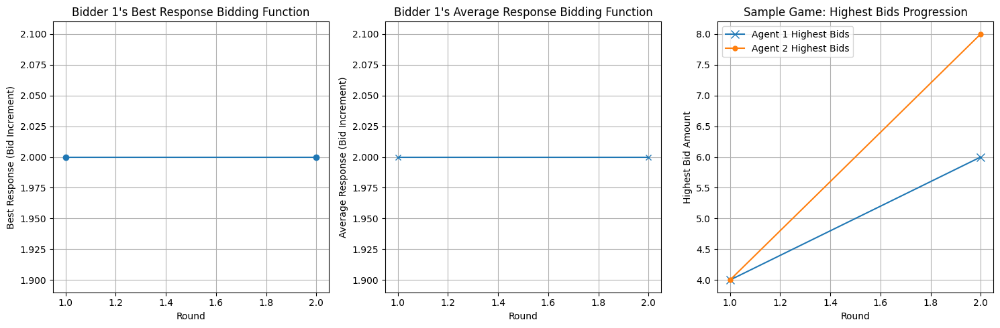

Game 26000: Avg Reward Agent 1: 1.20, Avg Reward Agent 2: 1.14, Epsilon: 0.0463, Total Avg Reward: 1.1705


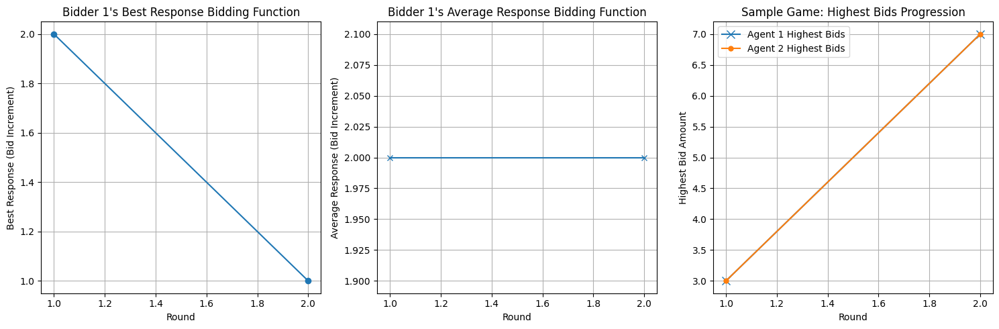

Game 27000: Avg Reward Agent 1: 1.16, Avg Reward Agent 2: 1.13, Epsilon: 0.0458, Total Avg Reward: 1.146


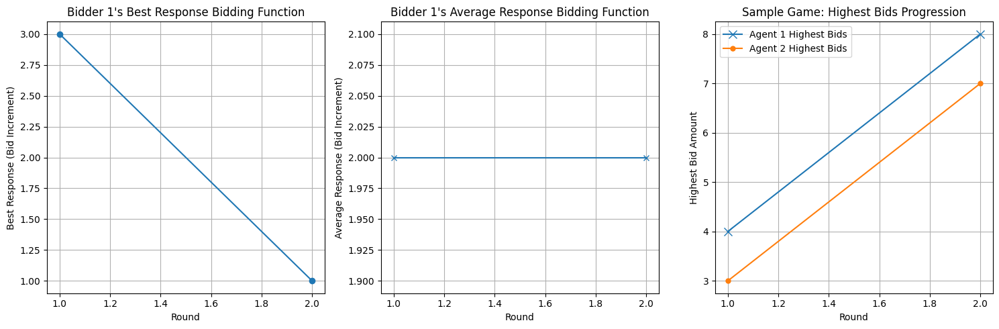

Game 28000: Avg Reward Agent 1: 1.22, Avg Reward Agent 2: 1.09, Epsilon: 0.0453, Total Avg Reward: 1.153


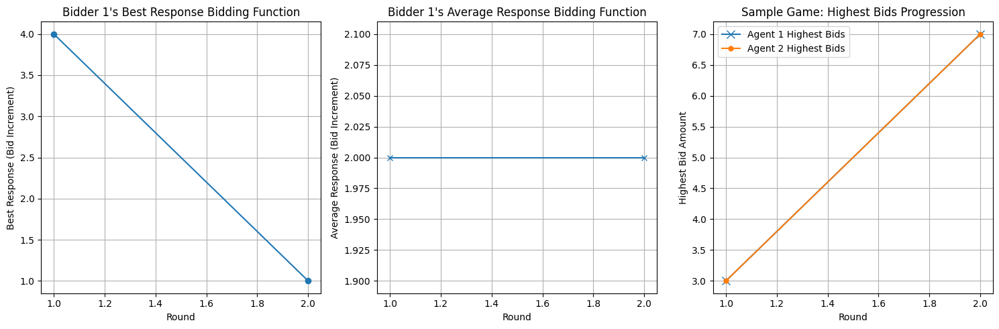

Game 29000: Avg Reward Agent 1: 1.15, Avg Reward Agent 2: 1.14, Epsilon: 0.0449, Total Avg Reward: 1.1425


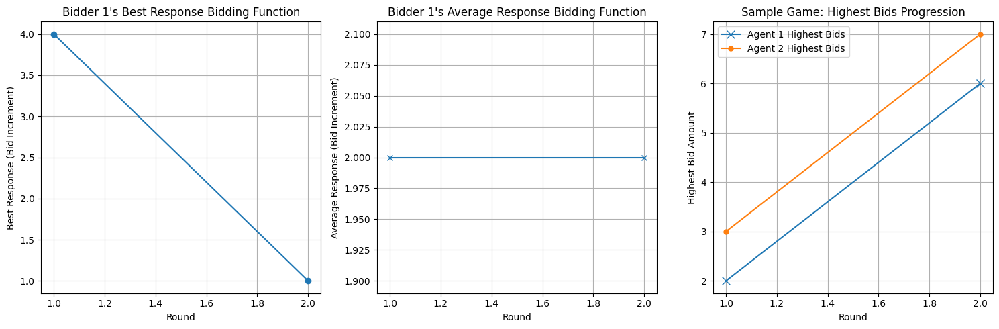

Game 30000: Avg Reward Agent 1: 1.16, Avg Reward Agent 2: 1.13, Epsilon: 0.0444, Total Avg Reward: 1.142


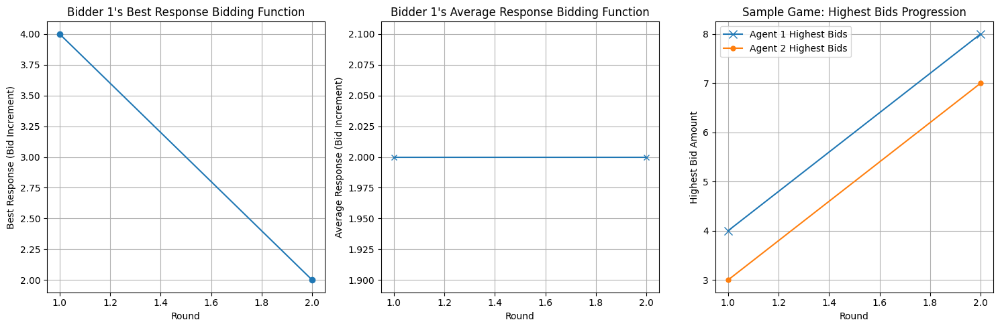

Game 31000: Avg Reward Agent 1: 1.15, Avg Reward Agent 2: 1.11, Epsilon: 0.0440, Total Avg Reward: 1.129


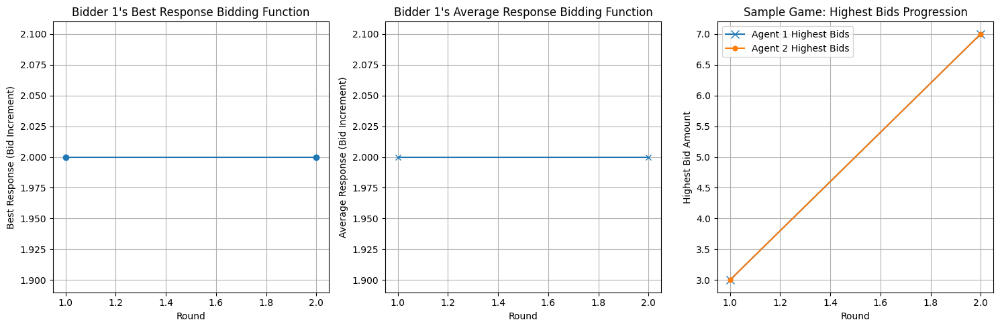

Game 32000: Avg Reward Agent 1: 1.11, Avg Reward Agent 2: 1.11, Epsilon: 0.0436, Total Avg Reward: 1.11


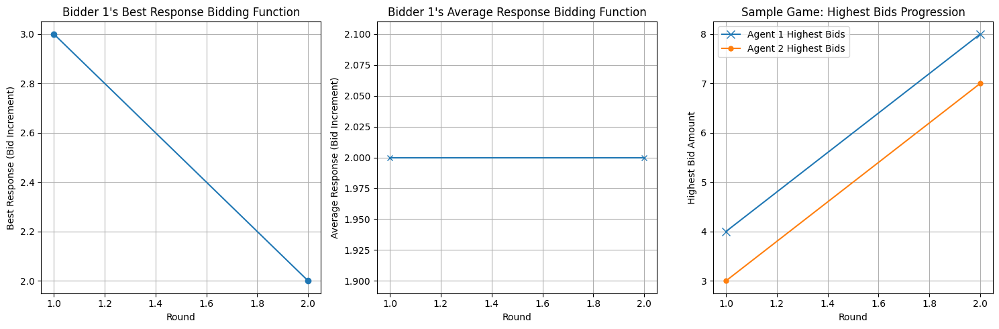

Game 33000: Avg Reward Agent 1: 1.19, Avg Reward Agent 2: 1.05, Epsilon: 0.0431, Total Avg Reward: 1.121


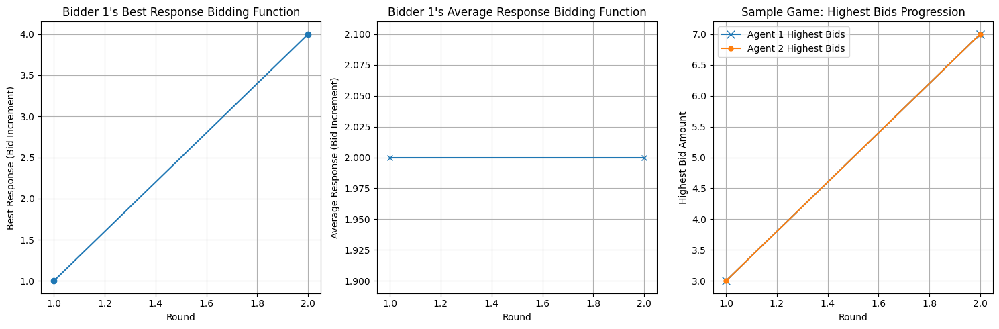

Game 34000: Avg Reward Agent 1: 1.18, Avg Reward Agent 2: 1.03, Epsilon: 0.0427, Total Avg Reward: 1.107


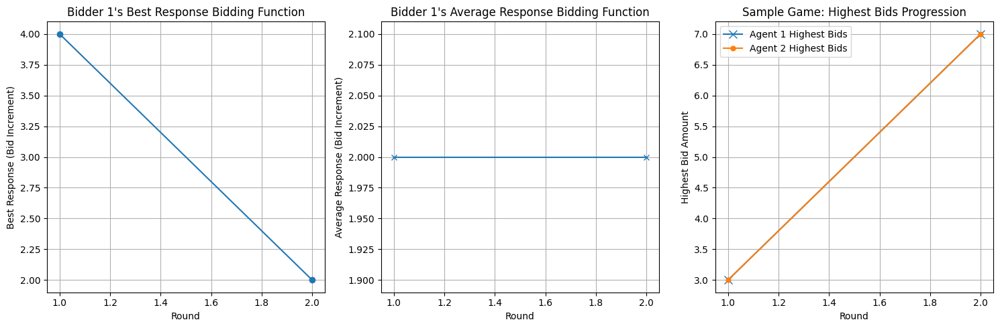

Game 35000: Avg Reward Agent 1: 1.16, Avg Reward Agent 2: 1.05, Epsilon: 0.0423, Total Avg Reward: 1.1075


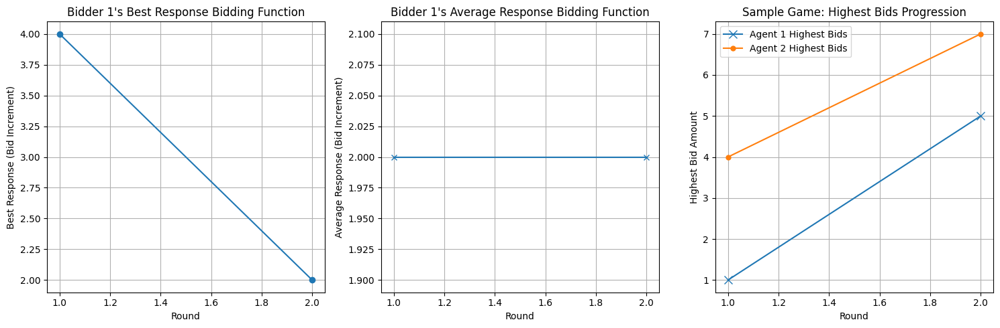

Game 36000: Avg Reward Agent 1: 1.15, Avg Reward Agent 2: 1.06, Epsilon: 0.0419, Total Avg Reward: 1.105


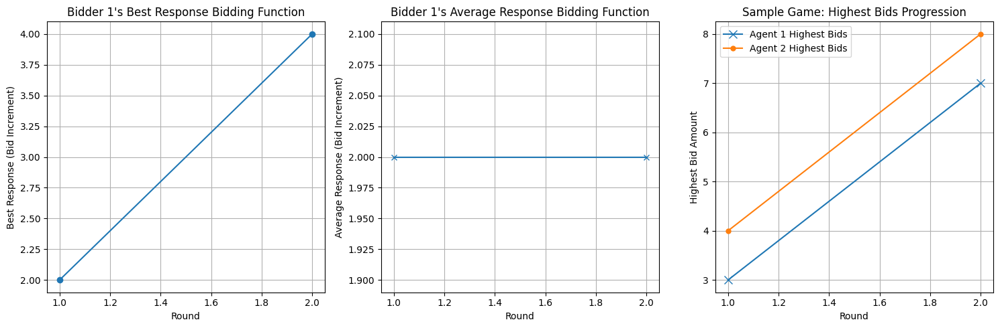

Game 37000: Avg Reward Agent 1: 1.19, Avg Reward Agent 2: 0.98, Epsilon: 0.0414, Total Avg Reward: 1.086


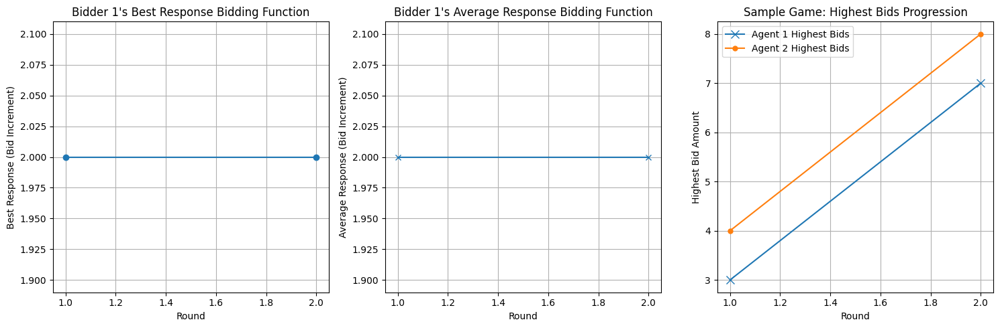

Game 38000: Avg Reward Agent 1: 1.22, Avg Reward Agent 2: 0.94, Epsilon: 0.0410, Total Avg Reward: 1.083


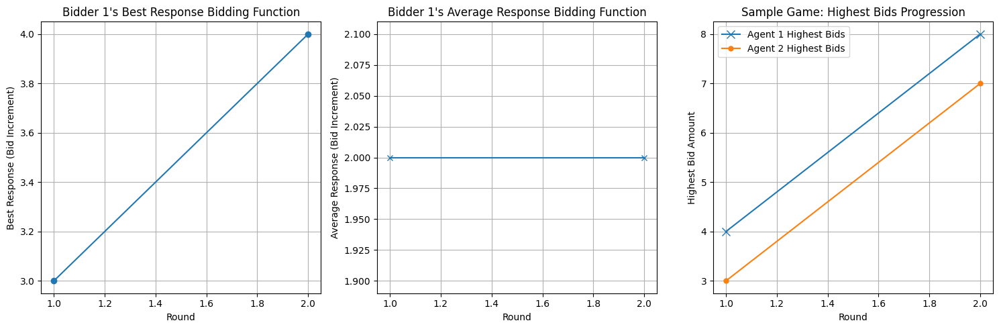

Game 39000: Avg Reward Agent 1: 1.24, Avg Reward Agent 2: 0.94, Epsilon: 0.0406, Total Avg Reward: 1.086


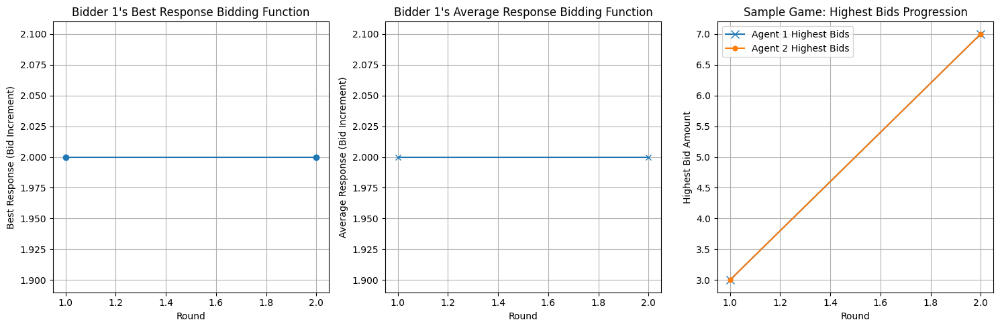

Game 40000: Avg Reward Agent 1: 1.22, Avg Reward Agent 2: 0.97, Epsilon: 0.0402, Total Avg Reward: 1.0915


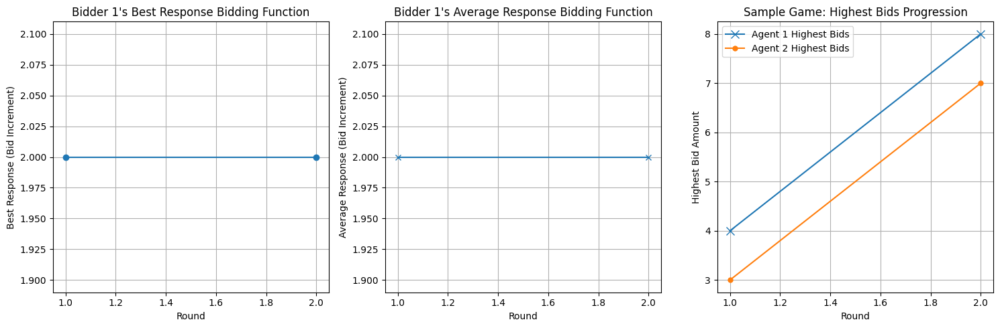

Game 41000: Avg Reward Agent 1: 1.23, Avg Reward Agent 2: 0.94, Epsilon: 0.0398, Total Avg Reward: 1.086


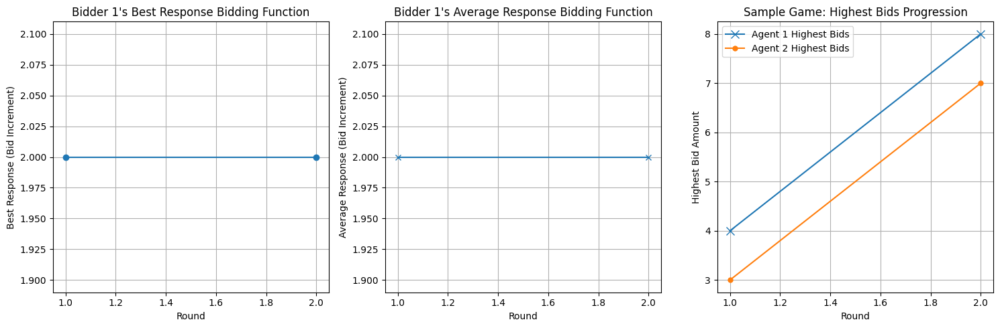

Game 42000: Avg Reward Agent 1: 1.28, Avg Reward Agent 2: 0.90, Epsilon: 0.0394, Total Avg Reward: 1.0905


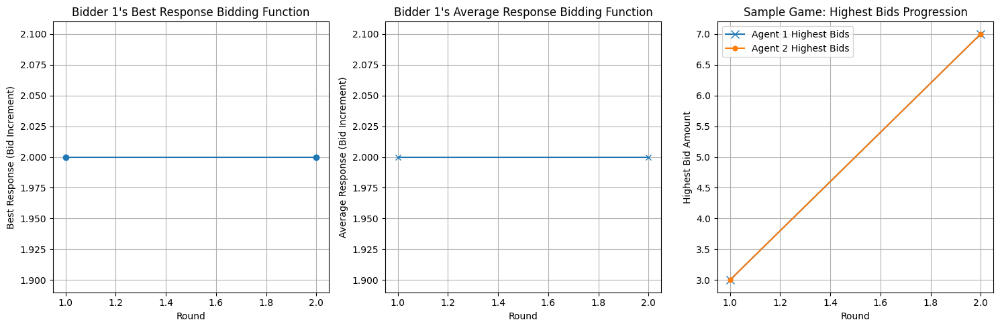

Game 43000: Avg Reward Agent 1: 1.30, Avg Reward Agent 2: 0.85, Epsilon: 0.0390, Total Avg Reward: 1.073


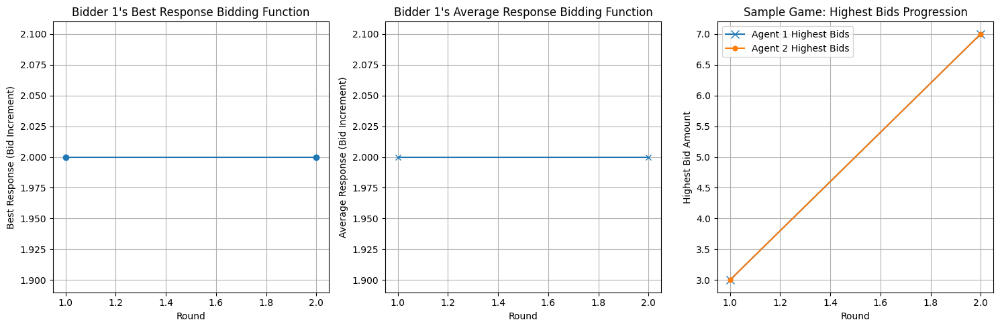

Game 44000: Avg Reward Agent 1: 1.26, Avg Reward Agent 2: 0.88, Epsilon: 0.0386, Total Avg Reward: 1.0685


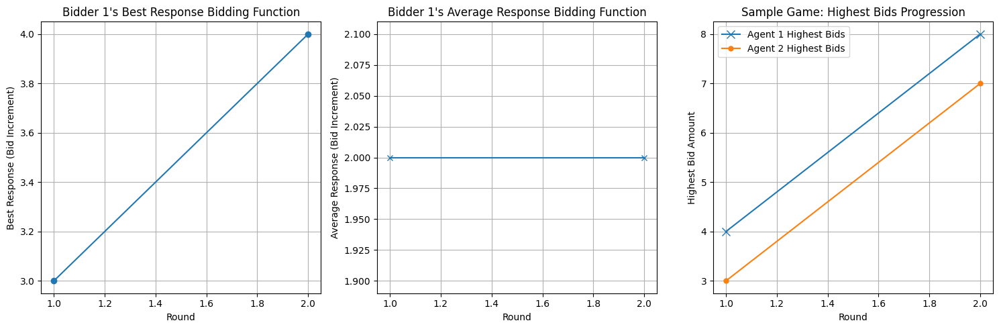

Game 45000: Avg Reward Agent 1: 1.24, Avg Reward Agent 2: 0.90, Epsilon: 0.0383, Total Avg Reward: 1.074


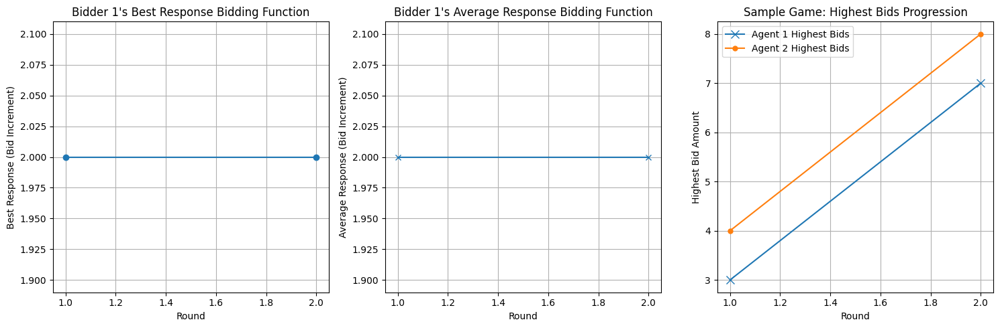

Game 46000: Avg Reward Agent 1: 1.30, Avg Reward Agent 2: 0.83, Epsilon: 0.0379, Total Avg Reward: 1.064


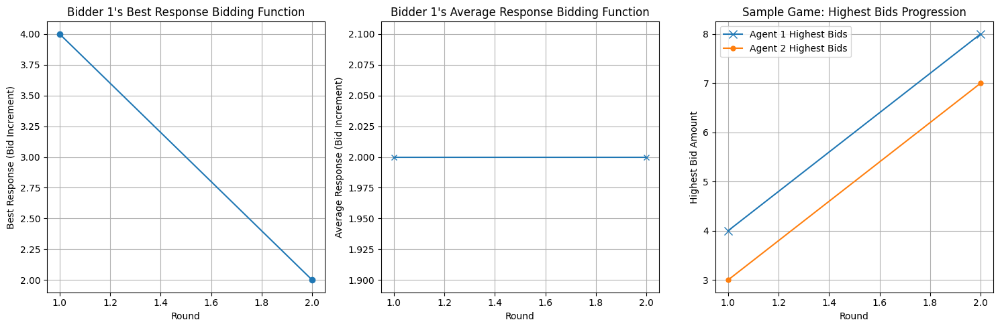

Game 47000: Avg Reward Agent 1: 1.28, Avg Reward Agent 2: 0.84, Epsilon: 0.0375, Total Avg Reward: 1.0615


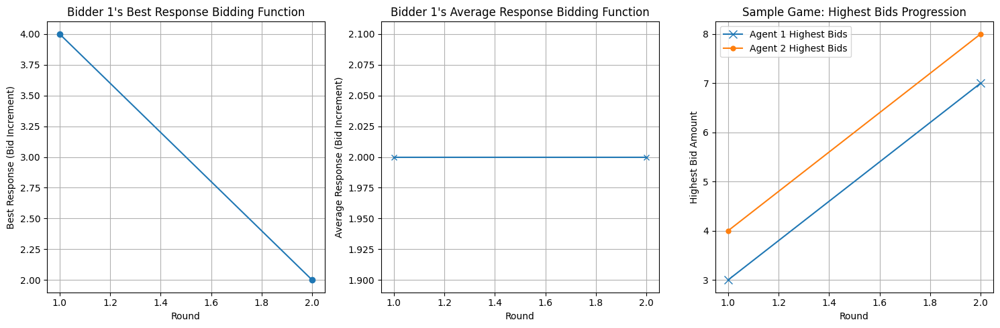

Game 48000: Avg Reward Agent 1: 1.37, Avg Reward Agent 2: 0.77, Epsilon: 0.0371, Total Avg Reward: 1.071


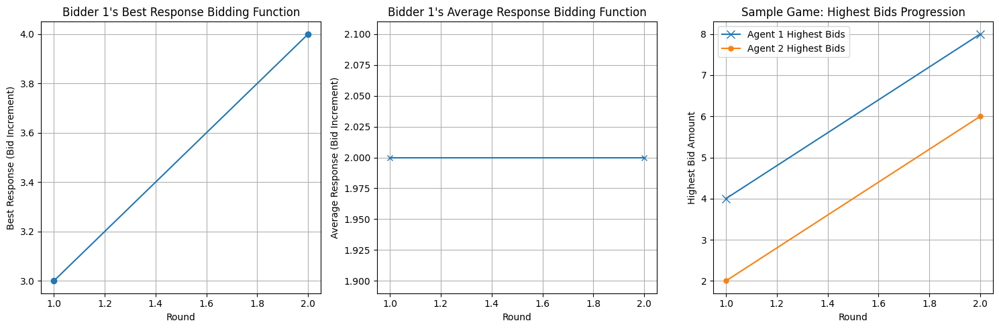

Game 49000: Avg Reward Agent 1: 1.32, Avg Reward Agent 2: 0.80, Epsilon: 0.0368, Total Avg Reward: 1.06


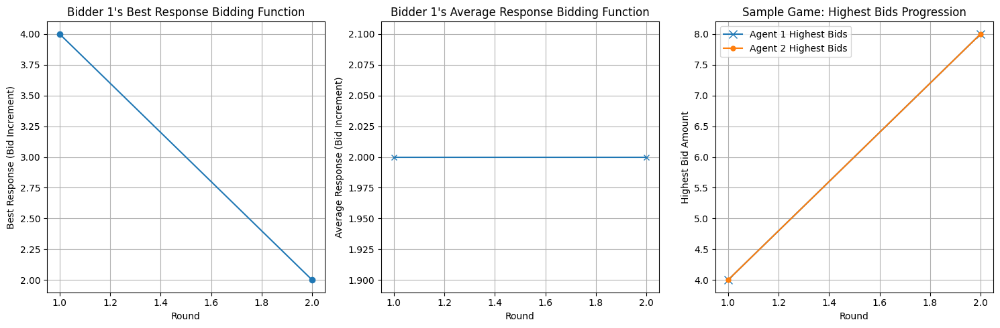

Game 50000: Avg Reward Agent 1: 1.33, Avg Reward Agent 2: 0.80, Epsilon: 0.0364, Total Avg Reward: 1.0615


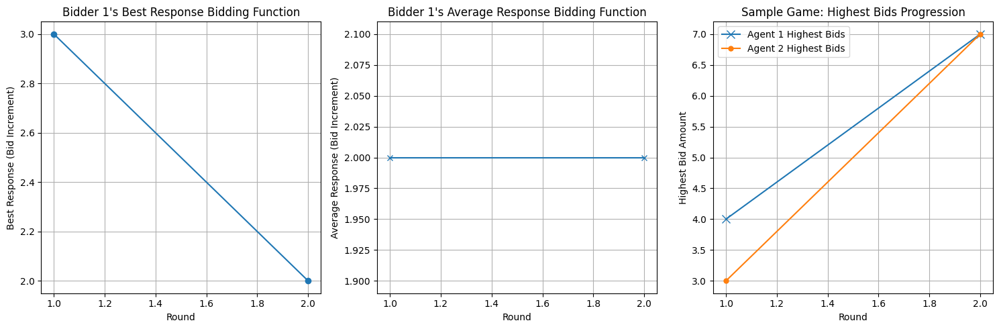

Game 51000: Avg Reward Agent 1: 1.36, Avg Reward Agent 2: 0.76, Epsilon: 0.0360, Total Avg Reward: 1.0605


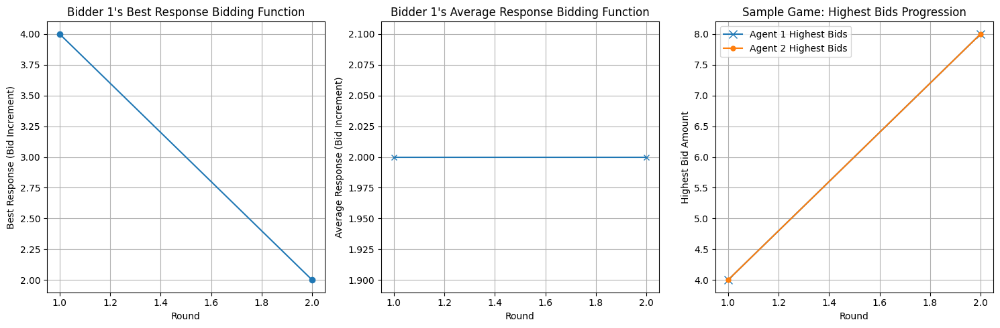

Game 52000: Avg Reward Agent 1: 1.29, Avg Reward Agent 2: 0.81, Epsilon: 0.0357, Total Avg Reward: 1.0505


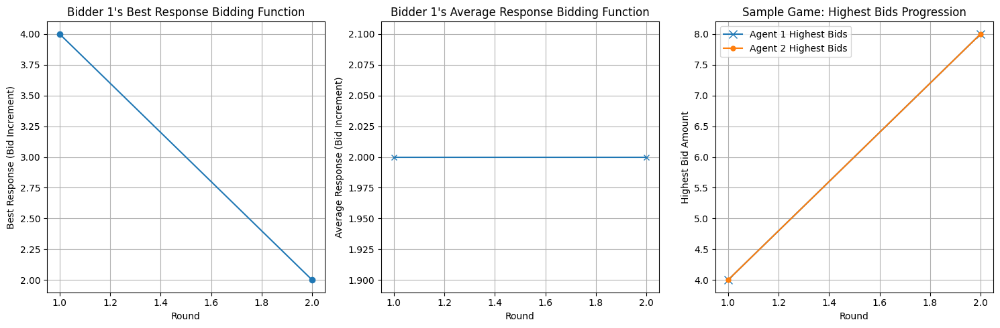

Game 53000: Avg Reward Agent 1: 1.33, Avg Reward Agent 2: 0.77, Epsilon: 0.0353, Total Avg Reward: 1.049


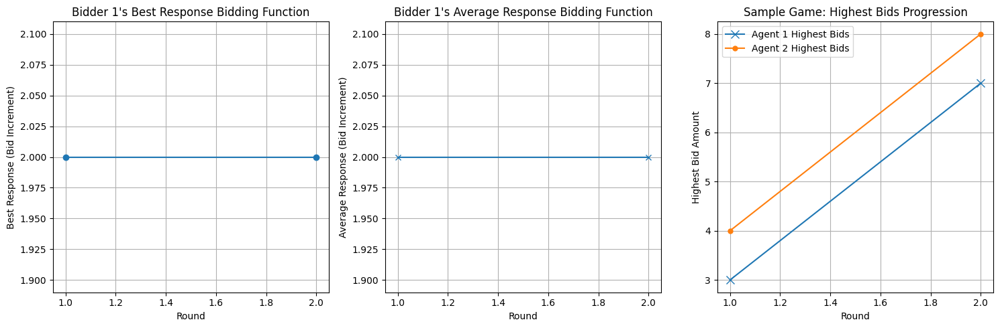

Game 54000: Avg Reward Agent 1: 1.39, Avg Reward Agent 2: 0.71, Epsilon: 0.0350, Total Avg Reward: 1.051


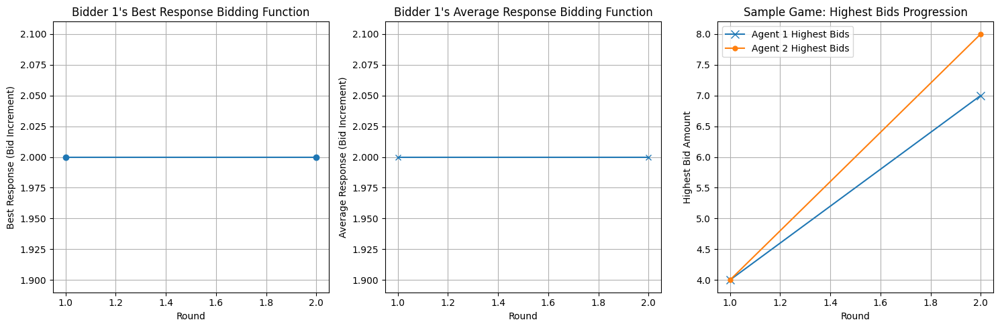

Game 55000: Avg Reward Agent 1: 1.41, Avg Reward Agent 2: 0.73, Epsilon: 0.0346, Total Avg Reward: 1.0655


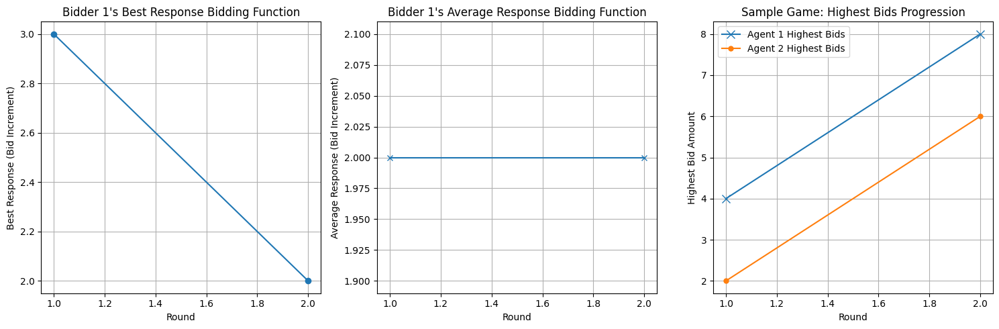

Game 56000: Avg Reward Agent 1: 1.40, Avg Reward Agent 2: 0.70, Epsilon: 0.0343, Total Avg Reward: 1.0465


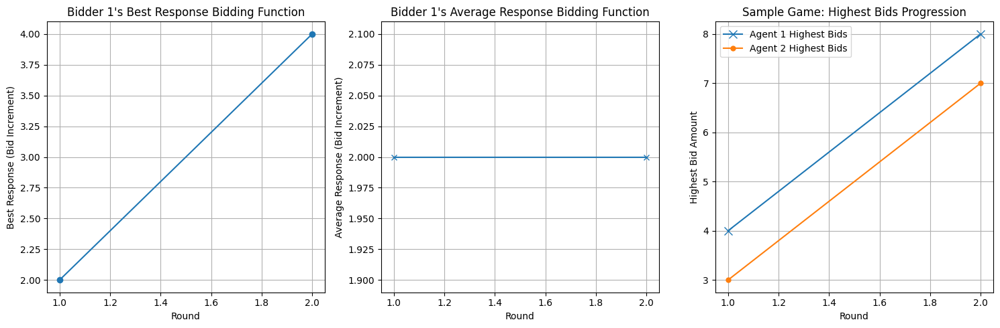

Game 57000: Avg Reward Agent 1: 1.37, Avg Reward Agent 2: 0.74, Epsilon: 0.0339, Total Avg Reward: 1.056


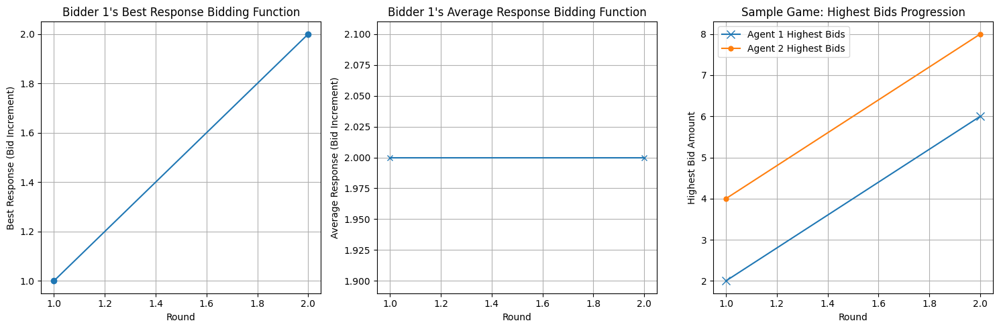

Game 58000: Avg Reward Agent 1: 1.29, Avg Reward Agent 2: 0.81, Epsilon: 0.0336, Total Avg Reward: 1.048


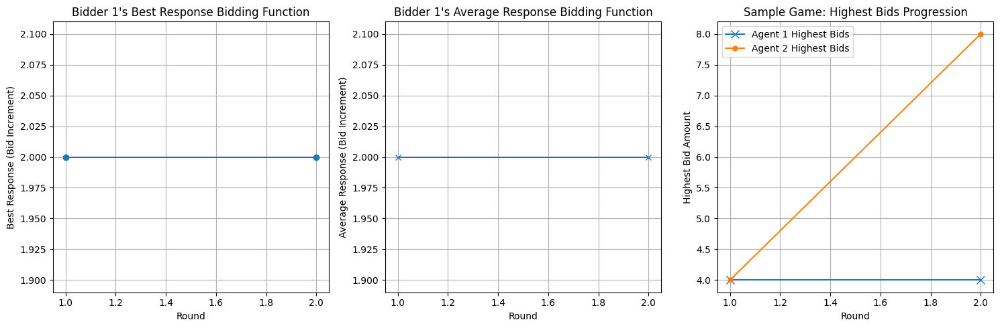

Game 59000: Avg Reward Agent 1: 1.38, Avg Reward Agent 2: 0.72, Epsilon: 0.0333, Total Avg Reward: 1.0525


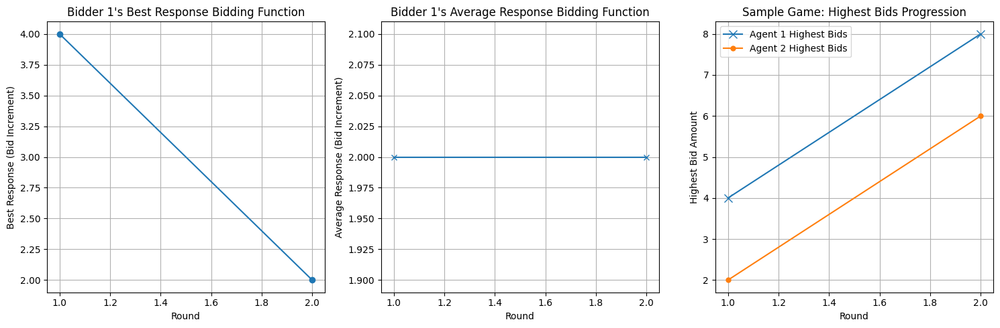

Game 60000: Avg Reward Agent 1: 1.40, Avg Reward Agent 2: 0.68, Epsilon: 0.0329, Total Avg Reward: 1.04


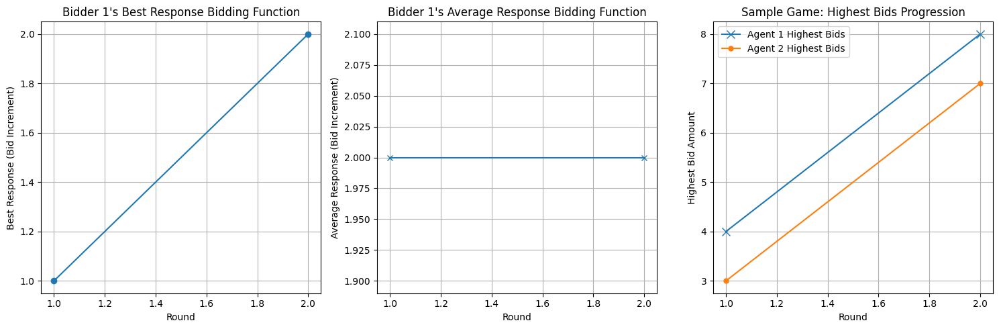

Game 61000: Avg Reward Agent 1: 1.38, Avg Reward Agent 2: 0.72, Epsilon: 0.0326, Total Avg Reward: 1.0455


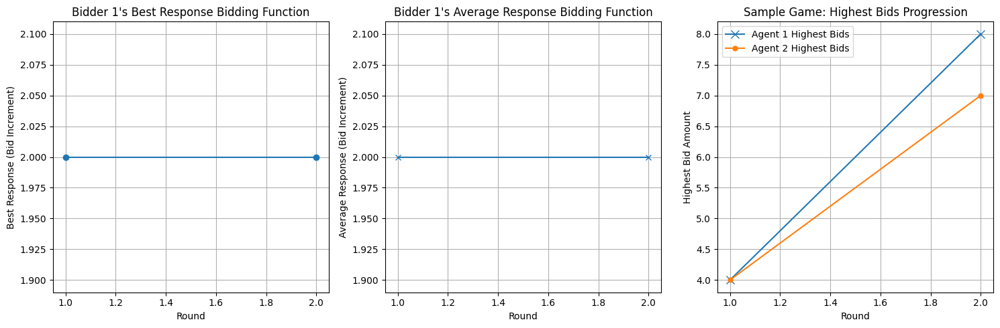

Game 62000: Avg Reward Agent 1: 1.47, Avg Reward Agent 2: 0.62, Epsilon: 0.0323, Total Avg Reward: 1.045


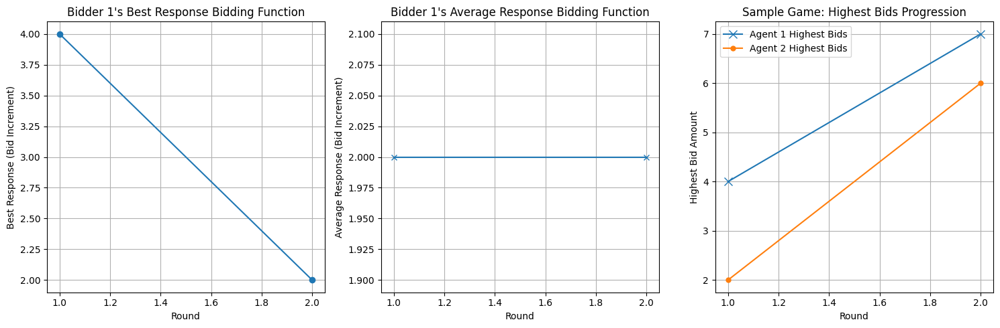

Game 63000: Avg Reward Agent 1: 1.39, Avg Reward Agent 2: 0.72, Epsilon: 0.0320, Total Avg Reward: 1.0525


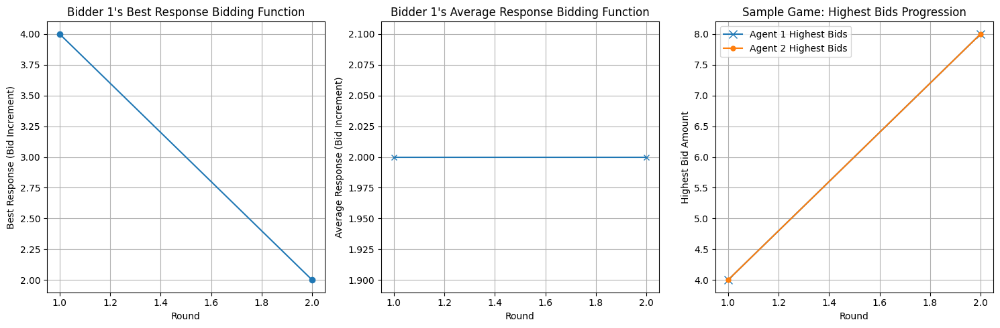

Game 64000: Avg Reward Agent 1: 1.45, Avg Reward Agent 2: 0.66, Epsilon: 0.0316, Total Avg Reward: 1.053


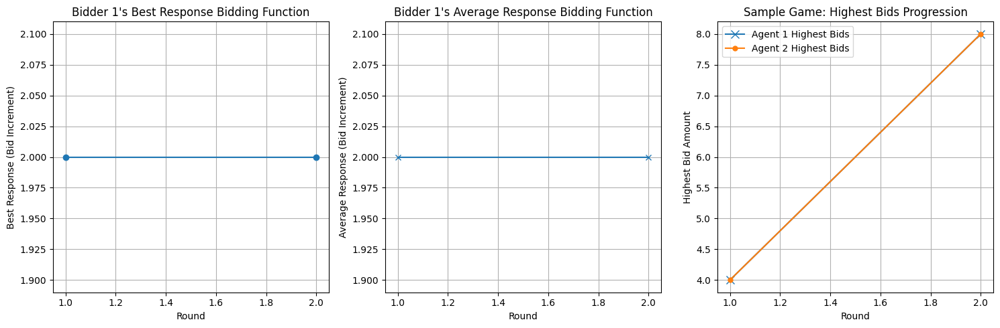

Game 65000: Avg Reward Agent 1: 1.44, Avg Reward Agent 2: 0.64, Epsilon: 0.0313, Total Avg Reward: 1.038


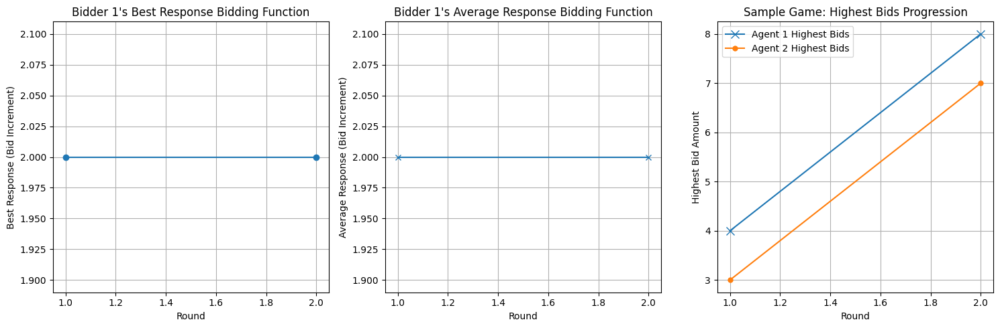

Game 66000: Avg Reward Agent 1: 1.50, Avg Reward Agent 2: 0.59, Epsilon: 0.0310, Total Avg Reward: 1.0445


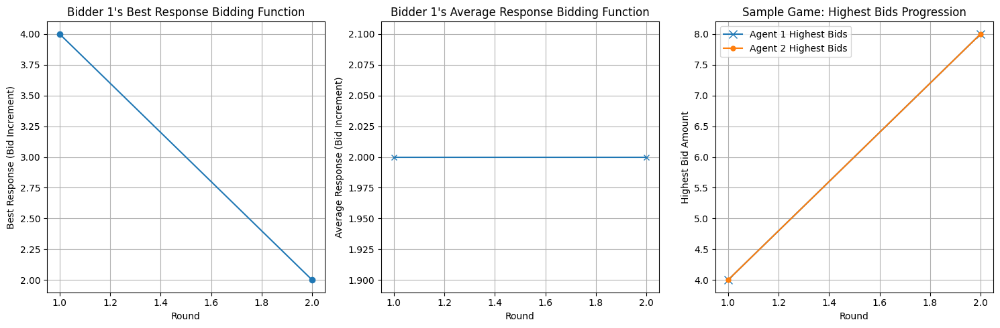

Game 67000: Avg Reward Agent 1: 1.46, Avg Reward Agent 2: 0.61, Epsilon: 0.0307, Total Avg Reward: 1.0355


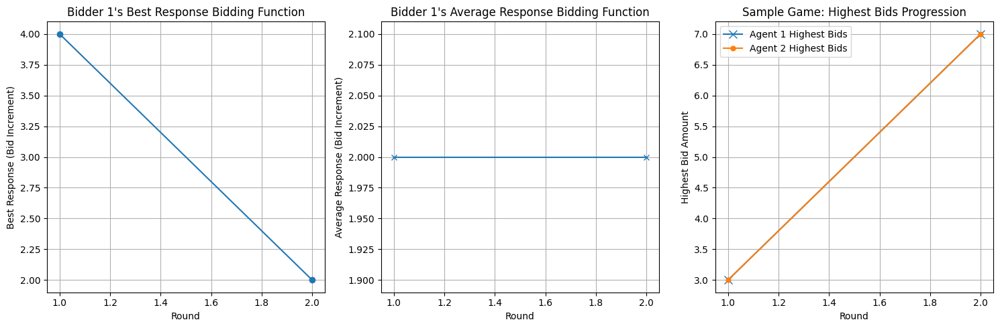

Game 68000: Avg Reward Agent 1: 1.47, Avg Reward Agent 2: 0.62, Epsilon: 0.0304, Total Avg Reward: 1.043


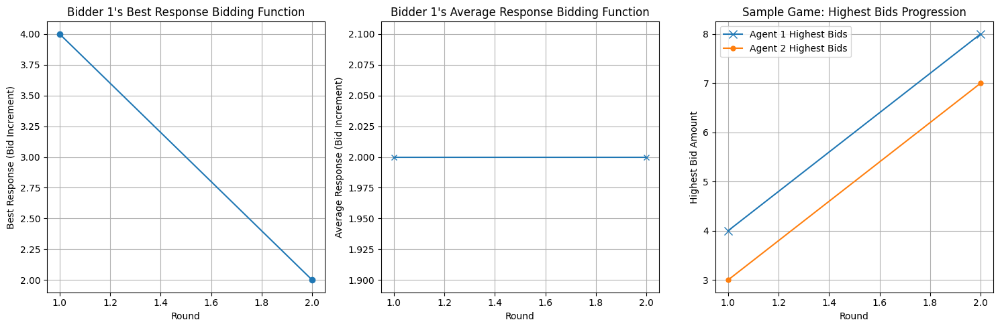

Game 69000: Avg Reward Agent 1: 1.48, Avg Reward Agent 2: 0.63, Epsilon: 0.0301, Total Avg Reward: 1.055


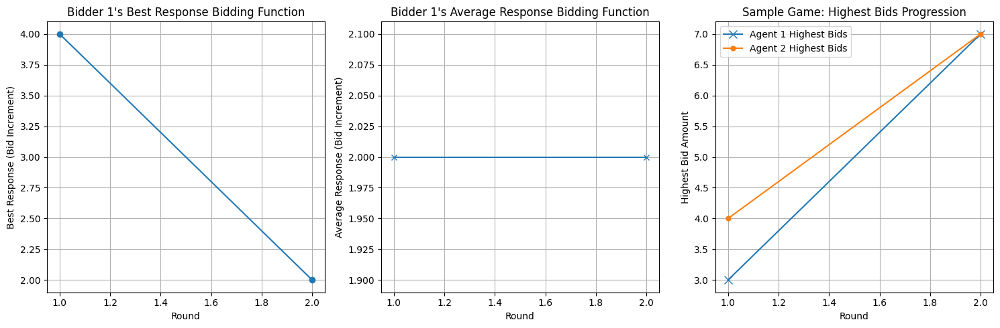

Game 70000: Avg Reward Agent 1: 1.48, Avg Reward Agent 2: 0.58, Epsilon: 0.0298, Total Avg Reward: 1.032


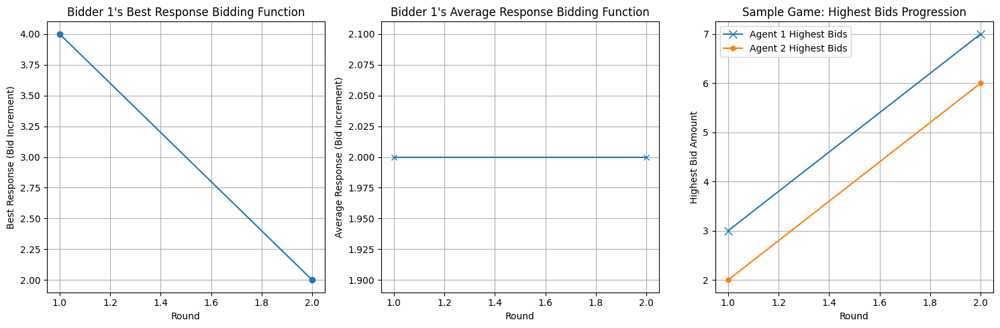

Game 71000: Avg Reward Agent 1: 1.45, Avg Reward Agent 2: 0.62, Epsilon: 0.0295, Total Avg Reward: 1.0315


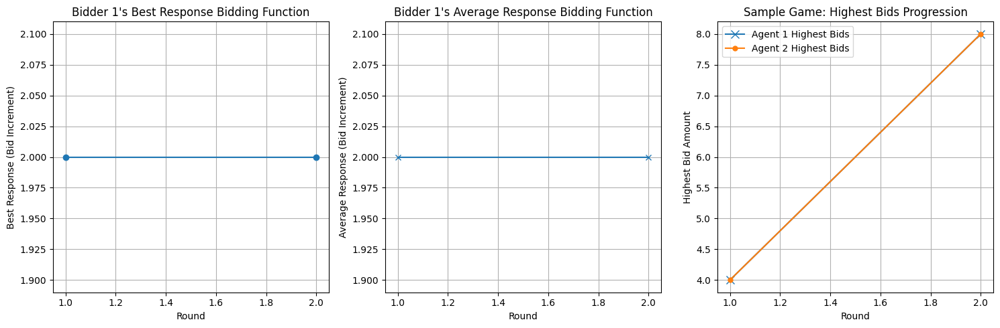

Game 72000: Avg Reward Agent 1: 1.52, Avg Reward Agent 2: 0.57, Epsilon: 0.0292, Total Avg Reward: 1.0445


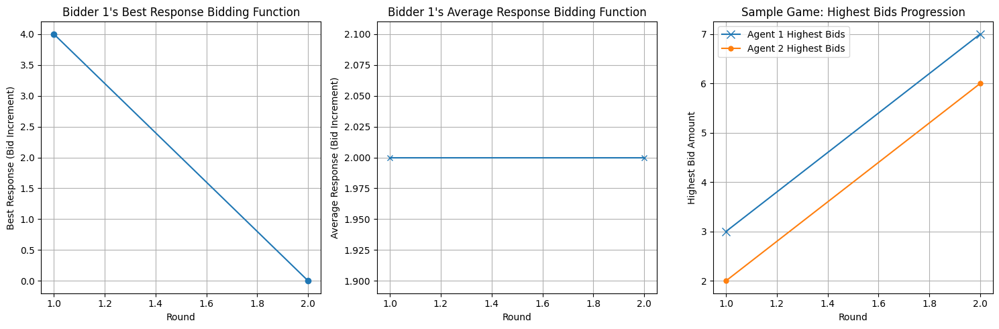

Game 73000: Avg Reward Agent 1: 1.47, Avg Reward Agent 2: 0.61, Epsilon: 0.0289, Total Avg Reward: 1.042


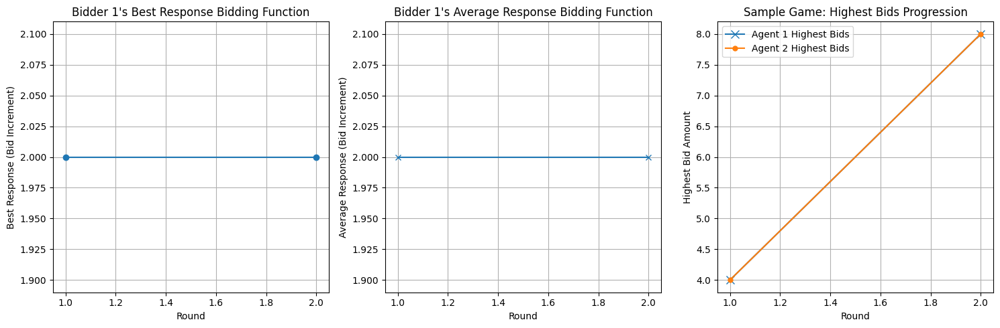

Game 74000: Avg Reward Agent 1: 1.53, Avg Reward Agent 2: 0.56, Epsilon: 0.0286, Total Avg Reward: 1.046


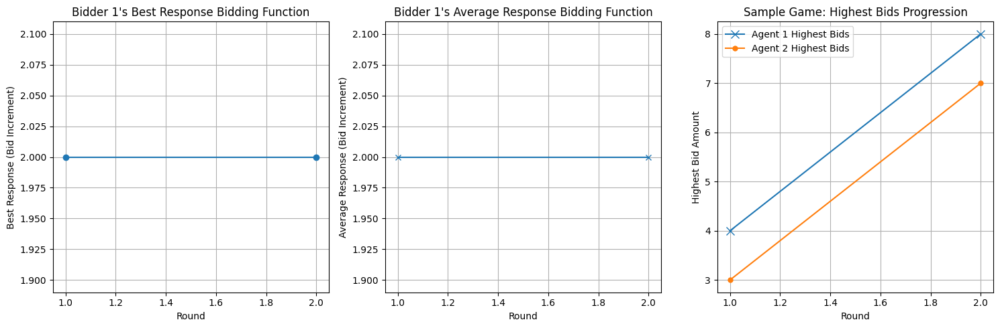

Game 75000: Avg Reward Agent 1: 1.51, Avg Reward Agent 2: 0.56, Epsilon: 0.0283, Total Avg Reward: 1.035


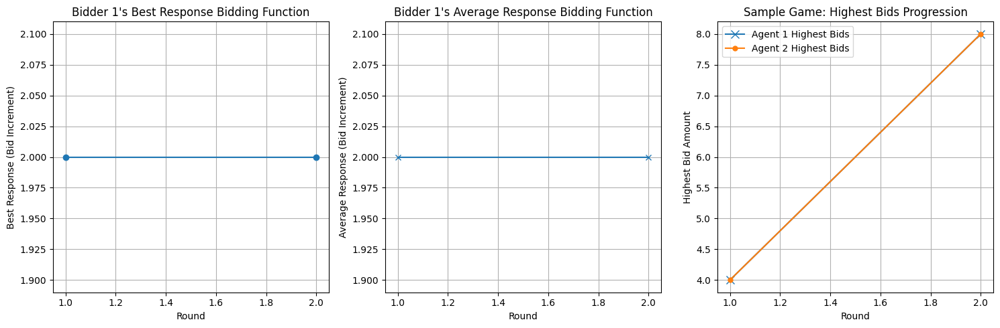

Game 76000: Avg Reward Agent 1: 1.51, Avg Reward Agent 2: 0.55, Epsilon: 0.0281, Total Avg Reward: 1.029


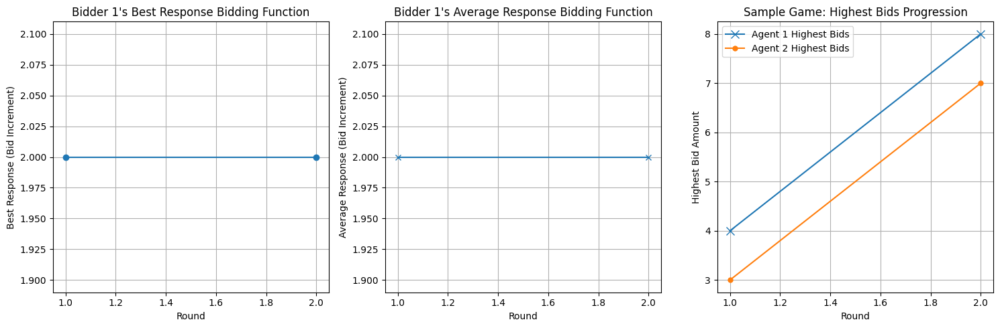

Game 77000: Avg Reward Agent 1: 1.49, Avg Reward Agent 2: 0.57, Epsilon: 0.0278, Total Avg Reward: 1.0295


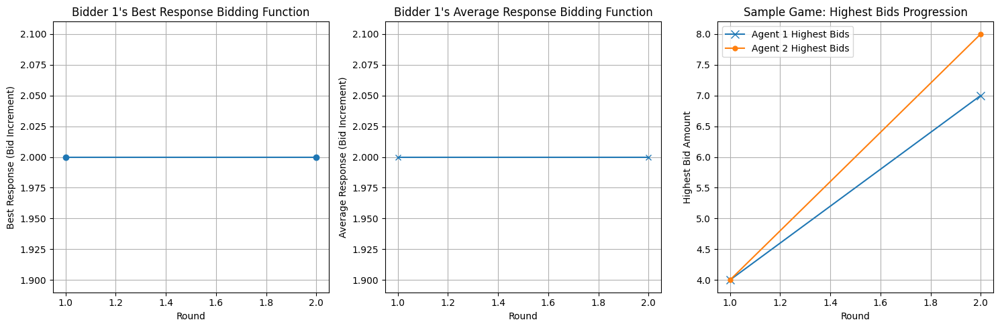

Game 78000: Avg Reward Agent 1: 1.54, Avg Reward Agent 2: 0.55, Epsilon: 0.0275, Total Avg Reward: 1.0425


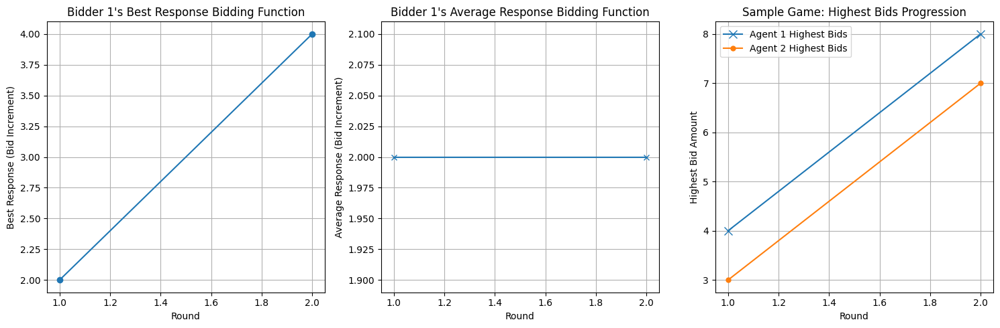

Game 79000: Avg Reward Agent 1: 1.44, Avg Reward Agent 2: 0.62, Epsilon: 0.0272, Total Avg Reward: 1.031


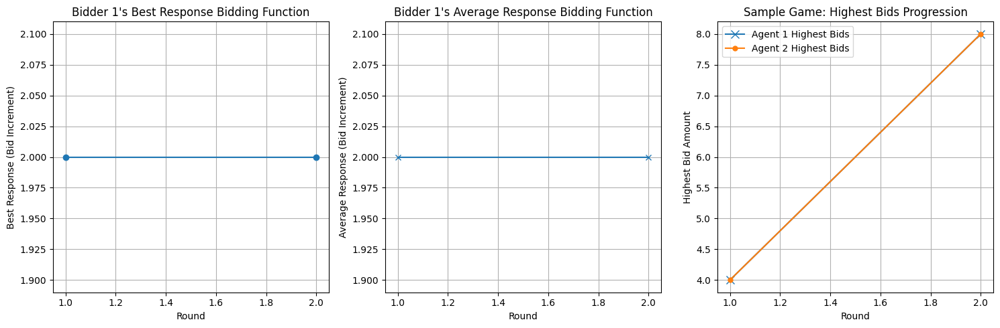

Game 80000: Avg Reward Agent 1: 1.52, Avg Reward Agent 2: 0.56, Epsilon: 0.0270, Total Avg Reward: 1.041


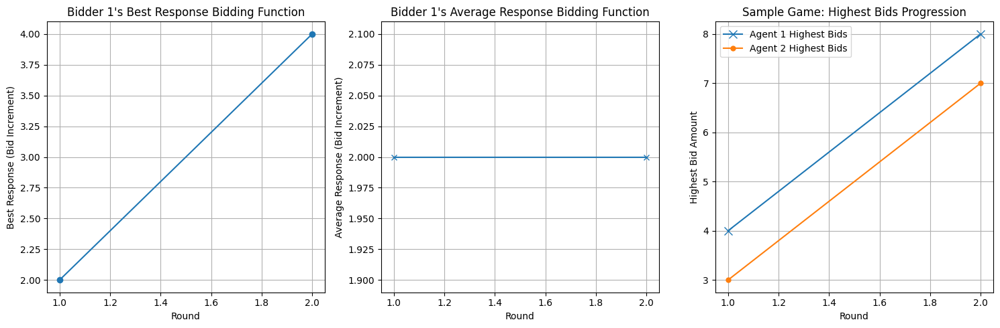

Game 81000: Avg Reward Agent 1: 1.52, Avg Reward Agent 2: 0.54, Epsilon: 0.0267, Total Avg Reward: 1.0295


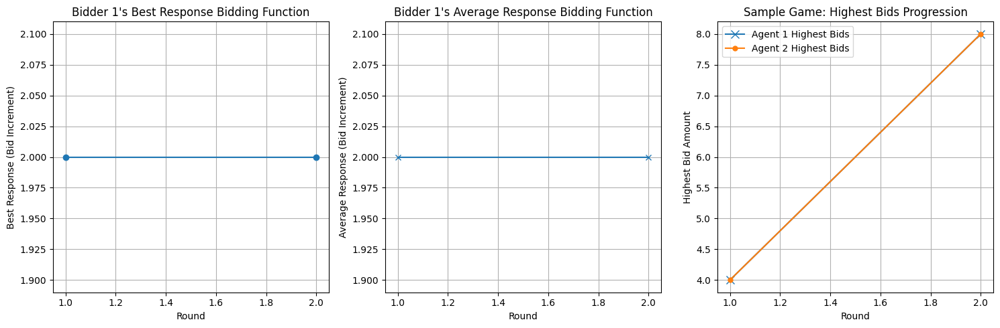

Game 82000: Avg Reward Agent 1: 1.55, Avg Reward Agent 2: 0.52, Epsilon: 0.0264, Total Avg Reward: 1.0335


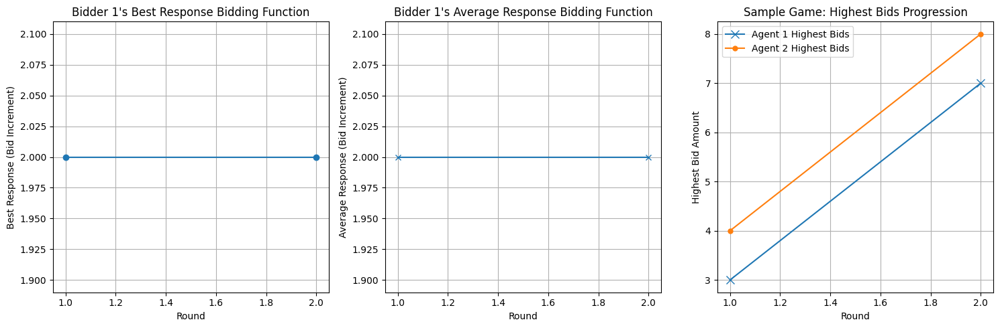

Game 83000: Avg Reward Agent 1: 1.54, Avg Reward Agent 2: 0.54, Epsilon: 0.0262, Total Avg Reward: 1.0365


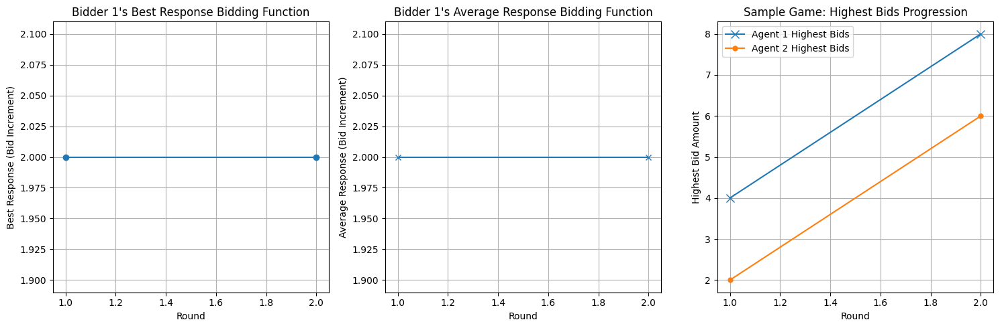

Game 84000: Avg Reward Agent 1: 1.52, Avg Reward Agent 2: 0.57, Epsilon: 0.0259, Total Avg Reward: 1.044


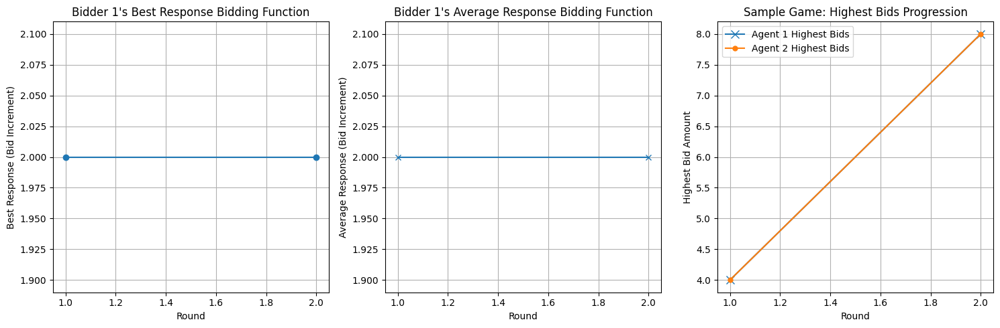

Game 85000: Avg Reward Agent 1: 1.58, Avg Reward Agent 2: 0.49, Epsilon: 0.0256, Total Avg Reward: 1.035


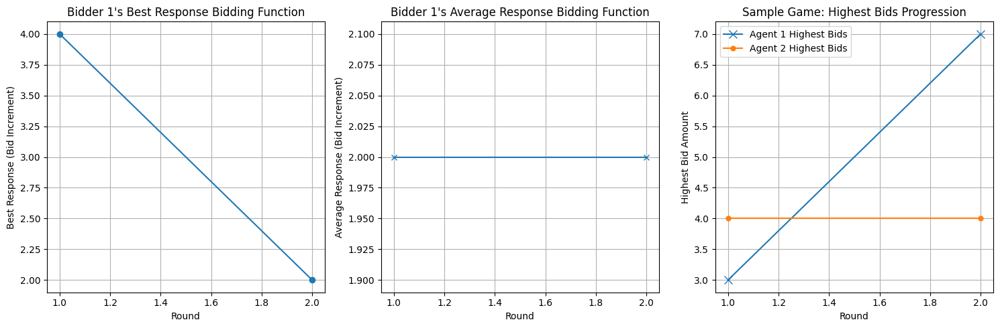

Game 86000: Avg Reward Agent 1: 1.53, Avg Reward Agent 2: 0.54, Epsilon: 0.0254, Total Avg Reward: 1.0335


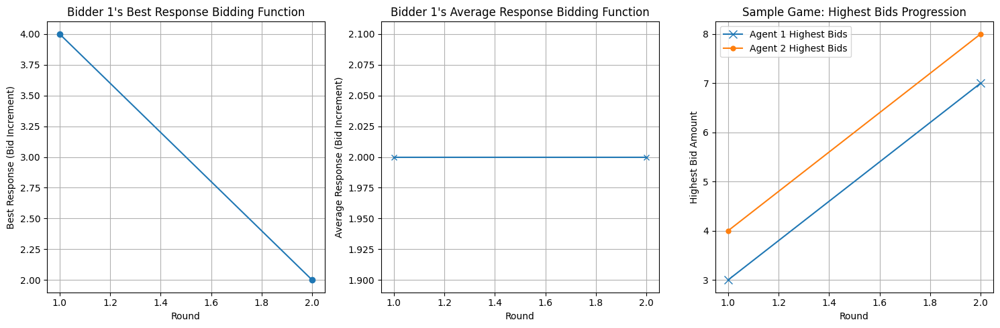

Game 87000: Avg Reward Agent 1: 1.57, Avg Reward Agent 2: 0.50, Epsilon: 0.0251, Total Avg Reward: 1.035


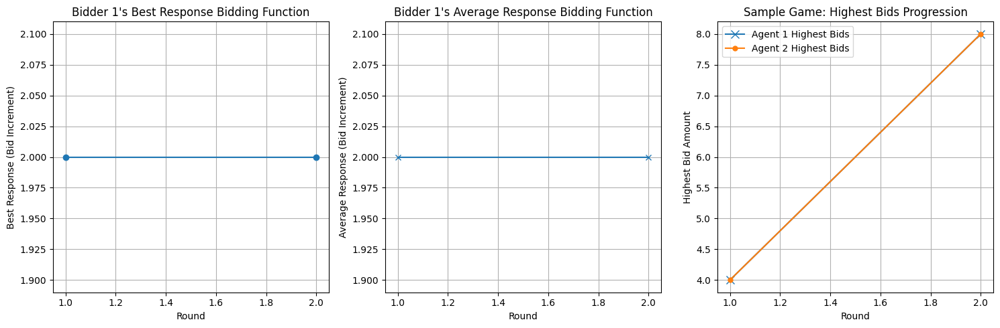

Game 88000: Avg Reward Agent 1: 1.58, Avg Reward Agent 2: 0.49, Epsilon: 0.0249, Total Avg Reward: 1.033


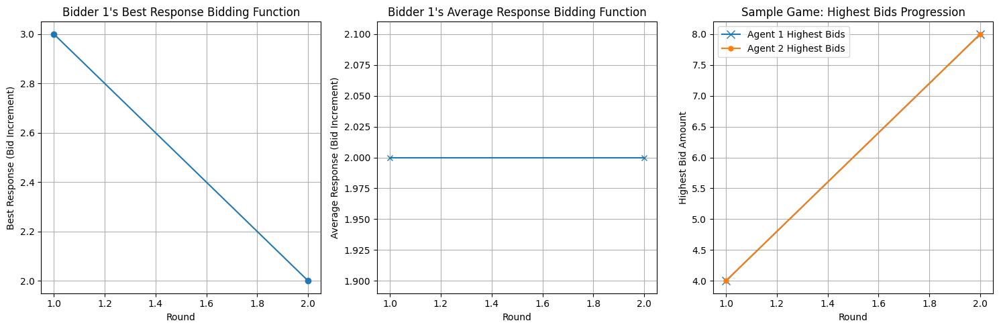

Game 89000: Avg Reward Agent 1: 1.56, Avg Reward Agent 2: 0.51, Epsilon: 0.0246, Total Avg Reward: 1.0375


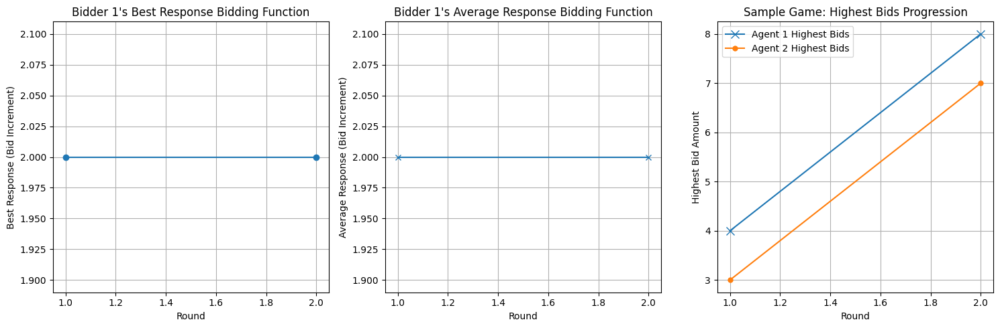

Game 90000: Avg Reward Agent 1: 1.53, Avg Reward Agent 2: 0.53, Epsilon: 0.0244, Total Avg Reward: 1.0265


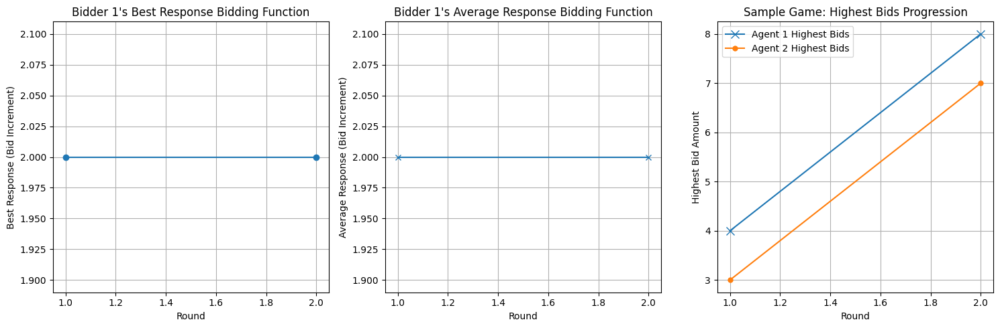

Game 91000: Avg Reward Agent 1: 1.54, Avg Reward Agent 2: 0.50, Epsilon: 0.0242, Total Avg Reward: 1.0235


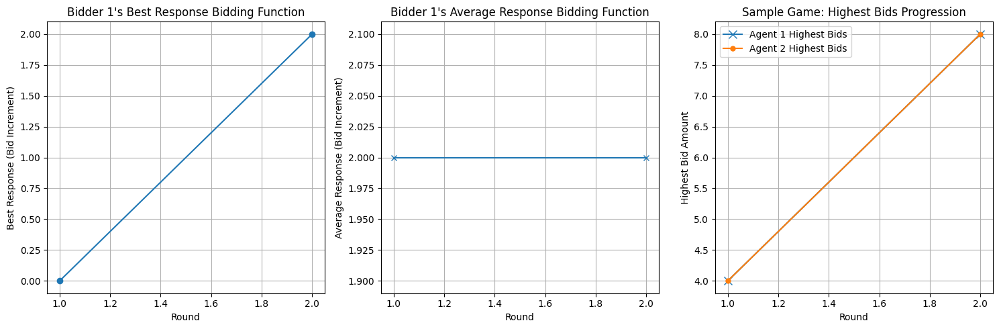

Game 92000: Avg Reward Agent 1: 1.61, Avg Reward Agent 2: 0.47, Epsilon: 0.0239, Total Avg Reward: 1.0395


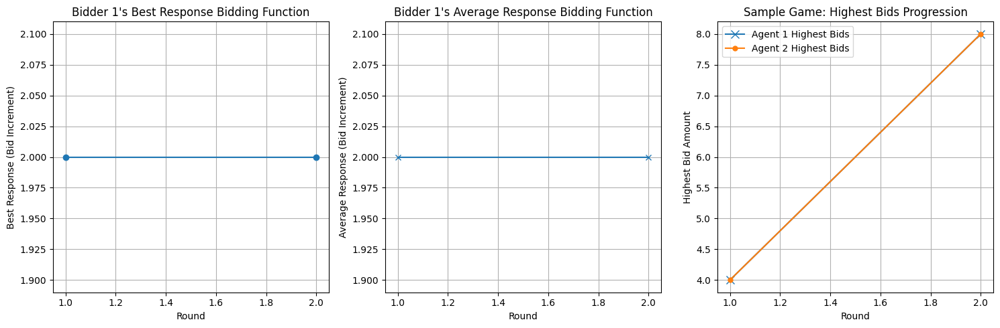

Game 93000: Avg Reward Agent 1: 1.57, Avg Reward Agent 2: 0.48, Epsilon: 0.0237, Total Avg Reward: 1.0255


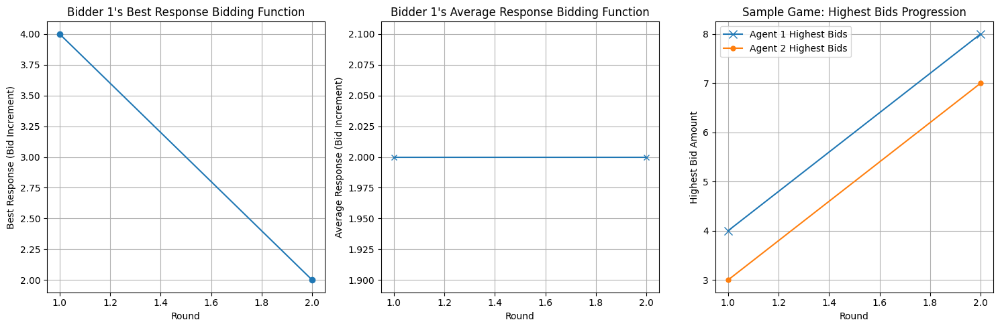

Game 94000: Avg Reward Agent 1: 1.57, Avg Reward Agent 2: 0.49, Epsilon: 0.0234, Total Avg Reward: 1.0285


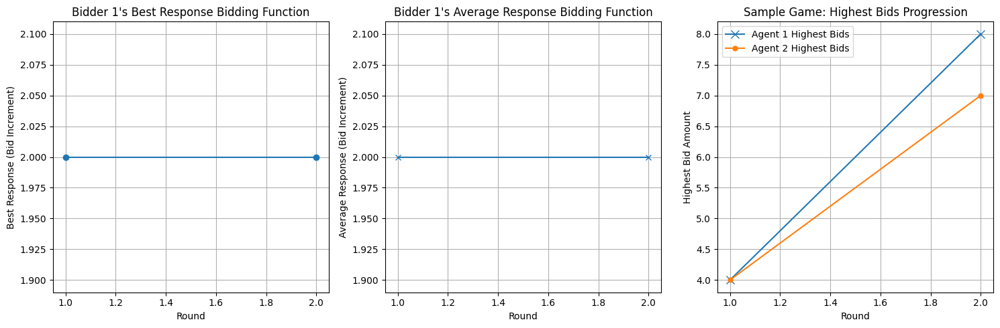

Game 95000: Avg Reward Agent 1: 1.59, Avg Reward Agent 2: 0.47, Epsilon: 0.0232, Total Avg Reward: 1.031


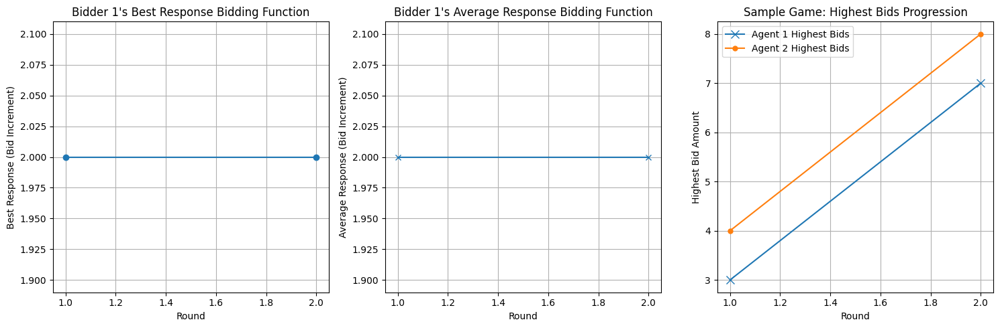

Game 96000: Avg Reward Agent 1: 1.61, Avg Reward Agent 2: 0.46, Epsilon: 0.0230, Total Avg Reward: 1.0345


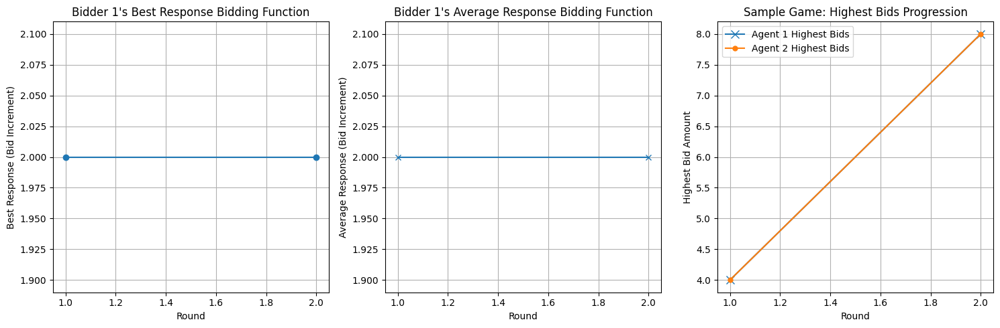

Game 97000: Avg Reward Agent 1: 1.67, Avg Reward Agent 2: 0.39, Epsilon: 0.0227, Total Avg Reward: 1.03


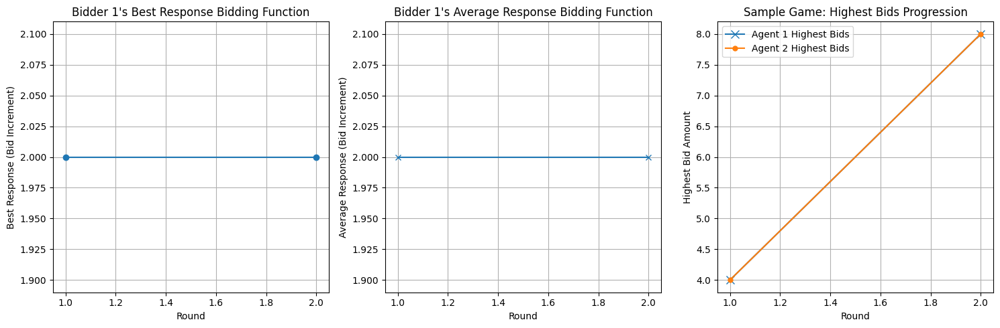

KeyboardInterrupt: 

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from collections import deque
import random

# Set random seeds for reproducibility
np.random.seed(0)
torch.manual_seed(0)

# Parameters
num_rounds = 2       # Number of rounds in each game
valuation = 10       # Maximum value that agents can bid for an item
num_actions = 5      # Total number of discrete actions (bids) each agent can take
actions = np.arange(num_actions)  # Possible actions (bids)
epsilon_start = 0.06   # Initial exploration rate (ε)
epsilon_min = 0.0    # Minimum exploration rate
epsilon_decay = 0.99999  # Exploration decay based on the inverse square root of iterations
learning_rate_rl = 0.1   # Learning rate for RL (Q-network)
learning_rate_sl = 0.005  # Learning rate for SL (policy network)
discount_factor = 0.99   # Discount factor for future rewards (γ)
anticipatory_param = 0.1  # Probability of using the RL policy (η)
batch_size = 128       # Batch size for training
memory_capacity_rl = 200000  # Capacity for RL replay buffer (M_RL)
memory_capacity_sl = 2000000  # Capacity for SL replay buffer (M_SL)
num_games = 10_000_000  # Total number of games to train the agents
verbose_interval = 1000  # Interval at which training progress is printed
update_target_every = 300  # Target network update frequency (refit every 300 updates)
gradient_updates_per_step = 2  # Two gradient updates per step (one for RL and one for SL)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Experience Replay Buffers
class CircularReplayBuffer:
    def __init__(self, capacity):
        self.capacity = capacity
        self.memory = deque(maxlen=capacity)
        
    def push(self, *args):
        self.memory.append(tuple(arg.detach().cpu() if isinstance(arg, torch.Tensor) else arg for arg in args))
        
    def sample(self, batch_size):
        batch = random.sample(self.memory, batch_size)
        return zip(*batch)
    
    def __len__(self):
        return len(self.memory)

class ReservoirReplayBuffer:
    def __init__(self, capacity):
        self.capacity = capacity
        self.memory = []
        self.n = 0  # Total number of items seen
        
    def push(self, *args):
        args = tuple(arg.detach().cpu() if isinstance(arg, torch.Tensor) else arg for arg in args)
        self.n += 1
        if len(self.memory) < self.capacity:
            self.memory.append(args)
        else:
            index = random.randint(0, self.n - 1)
            if index < self.capacity:
                self.memory[index] = args
                
    def sample(self, batch_size):
        batch = random.sample(self.memory, batch_size)
        return zip(*batch)
    
    def __len__(self):
        return len(self.memory)

# Neural Network Architectures
class QNetwork(nn.Module):
    def __init__(self, input_size, output_size):
        super(QNetwork, self).__init__()
        self.fc1 = nn.Linear(input_size, 64)
        self.fc2 = nn.Linear(64, output_size)
        self.relu = nn.ReLU()
        
    def forward(self, x):
        x = x.float()
        x = self.relu(self.fc1(x))
        x = self.fc2(x)
        return x

class PolicyNetwork(nn.Module):
    def __init__(self, input_size, output_size):
        super(PolicyNetwork, self).__init__()
        self.fc1 = nn.Linear(input_size, 64)
        self.fc2 = nn.Linear(64, output_size)
        self.relu = nn.ReLU()
        self.softmax = nn.Softmax(dim=1)
        
    def forward(self, x):
        x = x.float()
        x = self.relu(self.fc1(x))
        x = self.fc2(x)
        x = self.softmax(x)
        return x

# NFSPAgent Class
class NFSPAgent:
    def __init__(self, num_rounds, num_actions, anticipatory_param, agent_id):
        self.num_rounds = num_rounds
        self.num_actions = num_actions
        self.anticipatory_param = anticipatory_param
        self.epsilon = epsilon_start
        self.epsilon_min = epsilon_min
        self.epsilon_decay = epsilon_decay
        self.agent_id = agent_id
        
        # Input size includes the state representation: [rounds_left, holding_highest_bid (0/1), current_bid]
        input_size = 3
        self.q_network = QNetwork(input_size, num_actions).to(device)
        self.q_network_target = QNetwork(input_size, num_actions).to(device)
        self.policy_network = PolicyNetwork(input_size, num_actions).to(device)
        
        self.q_network_target.load_state_dict(self.q_network.state_dict())
        self.q_network_target.eval()
        
        # Optimizers
        self.q_optimizer = optim.Adam(self.q_network.parameters(), lr=learning_rate)
        self.policy_optimizer = optim.Adam(self.policy_network.parameters(), lr=learning_rate)
        
        # Replay Buffers
        self.replay_memory_rl = CircularReplayBuffer(memory_capacity_rl)
        self.replay_memory_sl = ReservoirReplayBuffer(memory_capacity_sl)
        
        self.steps_done = 0
        
    def select_action(self, state):
        state_tensor = torch.tensor([state], device=device)
        if random.random() < self.anticipatory_param:
            # Best Response Strategy (ε-greedy)
            if random.random() < self.epsilon:
                action = random.randrange(self.num_actions)
            else:
                with torch.no_grad():
                    action = self.q_network(state_tensor).argmax().item()
            use_best_response = True
        else:
            # Average Strategy (Policy Network)
            with torch.no_grad():
                probabilities = self.policy_network(state_tensor)
                action = np.random.choice(self.num_actions, p=probabilities.cpu().numpy()[0])
            use_best_response = False
        return action, use_best_response
        
    def add_experience_rl(self, state, action, reward, next_state, done):
        self.replay_memory_rl.push(torch.tensor(state, device=device),
                                   torch.tensor([action], device=device),
                                   torch.tensor([reward], device=device),
                                   torch.tensor(next_state, device=device),
                                   torch.tensor([done], device=device))
        
    def add_experience_sl(self, state, action):
        self.replay_memory_sl.push(torch.tensor(state, device=device),
                                   torch.tensor([action], device=device))
        
    def train_q_network(self):
        if len(self.replay_memory_rl) < batch_size:
            return
        states, actions, rewards, next_states, dones = self.replay_memory_rl.sample(batch_size)
        states = torch.stack(states).to(device)
        actions = torch.cat(actions).to(device)
        rewards = torch.cat(rewards).to(device)
        next_states = torch.stack(next_states).to(device)
        dones = torch.cat(dones).to(device).float()
        
        q_values = self.q_network(states).gather(1, actions.unsqueeze(1)).squeeze()
        with torch.no_grad():
            next_q_values = self.q_network_target(next_states).max(1)[0]
            target_q_values = rewards + (discount_factor * next_q_values * (1 - dones))
        
        loss = nn.functional.mse_loss(q_values, target_q_values)
        
        self.q_optimizer.zero_grad()
        loss.backward()
        self.q_optimizer.step()
        
    def train_policy_network(self):
        if len(self.replay_memory_sl) < batch_size:
            return
        states, actions = self.replay_memory_sl.sample(batch_size)
        states = torch.stack(states).to(device)
        actions = torch.cat(actions).to(device)
        
        probabilities = self.policy_network(states)
        loss = nn.functional.nll_loss(torch.log(probabilities), actions)
        
        self.policy_optimizer.zero_grad()
        loss.backward()
        self.policy_optimizer.step()
        
    def update_target_network(self):
        self.q_network_target.load_state_dict(self.q_network.state_dict())
        
    def decay_epsilon(self):
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay
        else:
            self.epsilon = self.epsilon_min

# Korean Auction Environment
class KoreanAuctionEnv:
    def __init__(self, num_rounds, num_actions, valuation):
        self.num_rounds = num_rounds
        self.num_actions = num_actions
        self.valuation = valuation
        self.reset()
        
    def reset(self):
        self.t = self.num_rounds
        self.s = 0  # 0 if Agent 1 holds the highest bid, 1 if Agent 2
        self.current_bid_q1 = 0
        self.current_bid_q2 = 0
        self.done = False
        return self.get_state()
        
    def get_state(self):
        # State representation: [rounds_left, holding_highest_bid (0 or 1), current_bid]
        state_q1 = [self.t, int(self.s == 0), self.current_bid_q1]
        state_q2 = [self.t, int(self.s == 1), self.current_bid_q2]
        return state_q1, state_q2
    
    def step(self, action_q1, action_q2):
        self.current_bid_q1 += action_q1
        self.current_bid_q2 += action_q2
        
        # Update who holds the highest bid
        if self.current_bid_q1 >= self.current_bid_q2:
            self.s = 0
        else:
            self.s = 1
        
        self.t -= 1
        if self.t <= 0:
            self.done = True
            # Calculate rewards
            if self.current_bid_q1 >= self.current_bid_q2 and self.current_bid_q1 <= self.valuation:
                reward_q1 = self.valuation - self.current_bid_q1
            else:
                reward_q1 = 0
            if self.current_bid_q2 > self.current_bid_q1 and self.current_bid_q2 <= self.valuation:
                reward_q2 = self.valuation - self.current_bid_q2
            else:
                reward_q2 = 0
        else:
            reward_q1 = 0
            reward_q2 = 0
        
        next_state_q1, next_state_q2 = self.get_state()
        return (next_state_q1, next_state_q2), (reward_q1, reward_q2), self.done

# Training function
def train_agents(agent1, agent2, env):
    reward_history_q1 = []
    reward_history_q2 = []
    steps = 0
    
    for game in range(num_games):
        state_q1, state_q2 = env.reset()
        while True:
            # Agent 1 selects action
            action_q1, use_br_q1 = agent1.select_action(state_q1)
            # Agent 2 selects action
            action_q2, use_br_q2 = agent2.select_action(state_q2)
            
            next_state, rewards, done = env.step(action_q1, action_q2)
            next_state_q1, next_state_q2 = next_state
            reward_q1, reward_q2 = rewards
            
            # Store transitions for RL
            agent1.add_experience_rl(state_q1, action_q1, reward_q1, next_state_q1, done)
            agent2.add_experience_rl(state_q2, action_q2, reward_q2, next_state_q2, done)
            
            # Store behavior for SL if used best response strategy
            if use_br_q1:
                agent1.add_experience_sl(state_q1, action_q1)
            if use_br_q2:
                agent2.add_experience_sl(state_q2, action_q2)
            
            # Train agents
            agent1.train_q_network()
            agent1.train_policy_network()
            agent2.train_q_network()
            agent2.train_policy_network()
            
            # Update target networks periodically
            steps += 1
            if steps % update_target_every == 0:
                agent1.update_target_network()
                agent2.update_target_network()
            
            if done:
                agent1.decay_epsilon()
                agent2.decay_epsilon()
                reward_history_q1.append(reward_q1)
                reward_history_q2.append(reward_q2)
                break
                
            state_q1 = next_state_q1
            state_q2 = next_state_q2
        
        if (game + 1) % verbose_interval == 0:
            avg_reward_q1 = np.mean(reward_history_q1[-verbose_interval:])
            avg_reward_q2 = np.mean(reward_history_q2[-verbose_interval:])
            total_reward = (np.sum(reward_history_q1[-verbose_interval:]) + np.sum(reward_history_q2[-verbose_interval:])) / (2 * verbose_interval)
            print(f"Game {game + 1}: Avg Reward Agent 1: {avg_reward_q1:.2f}, Avg Reward Agent 2: {avg_reward_q2:.2f}, Epsilon: {agent1.epsilon:.4f}, Total Avg Reward: {total_reward}")
            
            # Visualize best response and average response bidding functions + a sample game
            visualize_verbose_plots(agent1, env)

    return agent1, agent2, reward_history_q1, reward_history_q2

def visualize_verbose_plots(agent1, env):
    rounds = np.arange(1, num_rounds + 1)
    
    # 1. Best response bidding function (RL policy)
    best_response_actions = []
    for r in rounds:
        state = [num_rounds - r, 1, 0]  # Example state: round left, holding highest bid, current bid = 0
        action, _ = agent1.select_action(state)
        best_response_actions.append(action)
    
    # 2. Average response bidding function (SL policy)
    avg_response_actions = []
    for r in rounds:
        state = [num_rounds - r, 1, 0]  # Example state
        with torch.no_grad():
            state_tensor = torch.tensor([state], device=device)
            probabilities = agent1.policy_network(state_tensor)
            avg_action = np.argmax(probabilities.cpu().numpy()[0])
            avg_response_actions.append(avg_action)
    
    # 3. Sample game between two agents
    highest_bids_q1, highest_bids_q2, reward_q1, reward_q2, actions_q1, actions_q2 = play_game(agent1, agent1, env)
    
    plt.figure(figsize=(15, 5))
    
    # Plot 1: Best response bidding function vs rounds
    plt.subplot(1, 3, 1)
    plt.plot(rounds, best_response_actions, marker='o')
    plt.title("Bidder 1's Best Response Bidding Function")
    plt.xlabel('Round')
    plt.ylabel('Best Response (Bid Increment)')
    plt.grid(True)
    
    # Plot 2: Average response bidding function vs rounds
    plt.subplot(1, 3, 2)
    plt.plot(rounds, avg_response_actions, marker='x')
    plt.title("Bidder 1's Average Response Bidding Function")
    plt.xlabel('Round')
    plt.ylabel('Average Response (Bid Increment)')
    plt.grid(True)
    
    # Plot 3: Sample game between two agents
    plt.subplot(1, 3, 3)
    plt.plot(rounds, highest_bids_q1, 'x-', label='Agent 1 Highest Bids', markersize=8)
    plt.plot(rounds, highest_bids_q2, 'o-', label='Agent 2 Highest Bids', markersize=5)
    plt.title('Sample Game: Highest Bids Progression')
    plt.xlabel('Round')
    plt.ylabel('Highest Bid Amount')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()

# Play and visualize game function
def play_game(agent1, agent2, env):
    state_q1, state_q2 = env.reset()
    highest_bids_q1 = []
    highest_bids_q2 = []
    actions_q1 = []
    actions_q2 = []
    while True:
        action_q1, _ = agent1.select_action(state_q1)
        action_q2, _ = agent2.select_action(state_q2)
        actions_q1.append(action_q1)
        actions_q2.append(action_q2)
        next_state, rewards, done = env.step(action_q1, action_q2)
        next_state_q1, next_state_q2 = next_state
        highest_bids_q1.append(env.current_bid_q1)
        highest_bids_q2.append(env.current_bid_q2)
        if done:
            reward_q1, reward_q2 = rewards
            break
        state_q1 = next_state_q1
        state_q2 = next_state_q2
    return highest_bids_q1, highest_bids_q2, reward_q1, reward_q2, actions_q1, actions_q2

# Initialize environment and agents
env = KoreanAuctionEnv(num_rounds, num_actions, valuation)
agent1 = NFSPAgent(num_rounds, num_actions, anticipatory_param, agent_id=1)
agent2 = NFSPAgent(num_rounds, num_actions, anticipatory_param, agent_id=2)

# Train the agents
agent1, agent2, reward_history_q1, reward_history_q2 = train_agents(agent1, agent2, env)

# Play and visualize a game
highest_bids_q1, highest_bids_q2, reward_q1, reward_q2, actions_q1, actions_q2 = play_game(agent1, agent2, env)
visualize_verbose_plots(agent1, env)

print(f"Reward for Agent 1: {reward_q1}")
print(f"Reward for Agent 2: {reward_q2}")